In [2]:
import pandas as pd
import numpy as np
import seaborn
import matplotlib
import statistics
from sklearn.decomposition import PCA
from sklearn.decomposition import KernelPCA
from sklearn.manifold import TSNE
from sklearn.manifold import MDS
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
import math
import glob
from itertools import combinations
from matplotlib import pyplot as plt
from Bio import Phylo
import biotite
from pca_plot import *
from vst_function import *
from stattools.resampling import PermutationTest
from scipy import stats
from pyranges import PyRanges
import seaborn as sns

In [3]:
## Read and merge files 
anotation = pd.read_csv('../data/SGDP_anotation.csv', sep=',', encoding='latin-1')

ids_hg19 = pd.DataFrame()
ids_hg19['Sample'] = anotation['3-Illumina_ID']
ids_hg19['Region'] = anotation['10-Region']


In [4]:
# is not working 
chm13 = pd.read_csv('../call_cnvr_chm13/individual_cnv_cnvr.txt', sep='\t')
#chm13

/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_84620/700719383.py:2: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  chm13 = pd.read_csv('../call_cnvr_chm13/individual_cnv_cnvr.txt', sep='\t')


In [5]:
chm13 = chm13.dropna()
chm13

,Chr,Start,End,CNVR_ID,Sample_ID,CNV_Start,CNV_End,CNV_Value,Length
43107,22,15787747.0,51324926.0,CNVR_109275,LP6005442-DNA_A11,20039024,20042704,1,3681
43108,22,15787747.0,51324926.0,CNVR_109275,LP6005442-DNA_A11,20072827,20080819,1,7993
43109,22,15787747.0,51324926.0,CNVR_109275,LP6005442-DNA_A11,20093828,20095291,1,1464
43110,22,15787747.0,51324926.0,CNVR_109275,LP6005442-DNA_A11,20127368,20128368,1,1001
43111,22,15787747.0,51324926.0,CNVR_109275,LP6005442-DNA_A11,20142860,20144633,1,1774
...,...,...,...,...,...,...,...,...,...
35252344,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248364795,248366351,29,1557
35252345,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248366351,248367622,30,1272
35252346,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248367622,248368745,27,1124
35252347,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248368745,248370339,43,1595


In [6]:
chm13['CNV_Value'].max()

1685

In [7]:

## Keeping only samples that are on old cnvs 
chm13 = chm13.merge(ids_hg19, right_on=['Sample'], left_on=['Sample_ID'])


chm13


,Chr,Start,End,CNVR_ID,Sample_ID,CNV_Start,CNV_End,CNV_Value,Length,Sample,Region
0,22,15787747.0,51324926.0,CNVR_109275,LP6005442-DNA_A11,20039024,20042704,1,3681,LP6005442-DNA_A11,WestEurasia
1,22,15787747.0,51324926.0,CNVR_109275,LP6005442-DNA_A11,20072827,20080819,1,7993,LP6005442-DNA_A11,WestEurasia
2,22,15787747.0,51324926.0,CNVR_109275,LP6005442-DNA_A11,20093828,20095291,1,1464,LP6005442-DNA_A11,WestEurasia
3,22,15787747.0,51324926.0,CNVR_109275,LP6005442-DNA_A11,20127368,20128368,1,1001,LP6005442-DNA_A11,WestEurasia
4,22,15787747.0,51324926.0,CNVR_109275,LP6005442-DNA_A11,20142860,20144633,1,1774,LP6005442-DNA_A11,WestEurasia
...,...,...,...,...,...,...,...,...,...,...,...
25767495,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248364795,248366351,29,1557,LP6005441-DNA_B09,EastAsia
25767496,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248366351,248367622,30,1272,LP6005441-DNA_B09,EastAsia
25767497,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248367622,248368745,27,1124,LP6005441-DNA_B09,EastAsia
25767498,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248368745,248370339,43,1595,LP6005441-DNA_B09,EastAsia


In [8]:
#REMOVE SAMPLES WITH ABERRATIONS
samples_with_aberrations = ['LP6005441-DNA_B03', ' LP6005443-DNA_G01', 'LP6005441-DNA_G09', 'LP6005441-DNA_D04'] 

chm13 = chm13[~chm13.Sample.isin(samples_with_aberrations)]


chm13#.value_counts(by=["Sample_ID"])
chm13.columns = ['Chromosome', 'Start', 'End', 'CNVR_ID', 'Sample', 'CNV_start', 'CNV_end', 'CNV_Value','Length', 'Sample','Region']
chm13

,Chromosome,Start,End,CNVR_ID,Sample,CNV_start,CNV_end,CNV_Value,Length,Sample,Region
0,22,15787747.0,51324926.0,CNVR_109275,LP6005442-DNA_A11,20039024,20042704,1,3681,LP6005442-DNA_A11,WestEurasia
1,22,15787747.0,51324926.0,CNVR_109275,LP6005442-DNA_A11,20072827,20080819,1,7993,LP6005442-DNA_A11,WestEurasia
2,22,15787747.0,51324926.0,CNVR_109275,LP6005442-DNA_A11,20093828,20095291,1,1464,LP6005442-DNA_A11,WestEurasia
3,22,15787747.0,51324926.0,CNVR_109275,LP6005442-DNA_A11,20127368,20128368,1,1001,LP6005442-DNA_A11,WestEurasia
4,22,15787747.0,51324926.0,CNVR_109275,LP6005442-DNA_A11,20142860,20144633,1,1774,LP6005442-DNA_A11,WestEurasia
...,...,...,...,...,...,...,...,...,...,...,...
25767495,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248364795,248366351,29,1557,LP6005441-DNA_B09,EastAsia
25767496,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248366351,248367622,30,1272,LP6005441-DNA_B09,EastAsia
25767497,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248367622,248368745,27,1124,LP6005441-DNA_B09,EastAsia
25767498,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248368745,248370339,43,1595,LP6005441-DNA_B09,EastAsia


In [9]:
## ADDING DUPLICATION/DELETION COLUMN 
#deletions = chm13[chm13['CNV_Value'] < 2 ] 
#deletions['Type'] = 'deletion'
#duplications= chm13[chm13['CNV_Value'] > 2] 
#duplications['Type'] = 'duplication'

#frames = [deletions,duplications]

#chm13 = pd.concat(frames)
#chm13

In [10]:

## Anotations
t2t_genes = pd.read_csv('../annotation_files/T2T-chm13-catLiftOffGenes.csv')
t2t_genes.columns = ['Chromosome', 'Start', 'End', 'name', 'score', 'strand',
       'thickStart', 'thickEnd', 'reserved', 'blockCount', 'blockSizes',
       'chromStarts', 'name2', 'cdsStartStat', 'cdsEndStat', 'exonFrames',
       'txId', 'type', 'geneName', 'geneType', 'sourceGene',
       'sourceTranscript', 'alignmentId', 'alternativeSourceTranscripts',
       'Paralogy', 'UnfilteredParalogy', 'collapsedGeneIds',
       'collapsedGeneNames', 'frameshift', 'exonAnnotationSupport',
       'intronAnnotationSupport', 'transcriptClass', 'transcriptModes',
       'validStart', 'validStop', 'properOrf', 'extra_paralog']
t2t_genes = t2t_genes[['Chromosome', 'Start', 'End', 'name2']]
t2t_genes = PyRanges(t2t_genes)

/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_84620/867498234.py:2: DtypeWarning: Columns (23,36) have mixed types. Specify dtype option on import or set low_memory=False.
  t2t_genes = pd.read_csv('../annotation_files/T2T-chm13-catLiftOffGenes.csv')
/opt/anaconda3/lib/python3.11/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return {k: v for k, v in df.groupby(grpby_key)}


In [11]:
#chm13 = pd.read_csv('../data/chm13_gene_regions.csv', index_col=0)
chm13['Lenght'] = chm13['End'] - chm13['Start']
chm13

chm13 = chm13[chm13['Lenght'] < 200000] # 2000000
chm13



,Chromosome,Start,End,CNVR_ID,Sample,CNV_start,CNV_end,CNV_Value,Length,Sample,Region,Lenght
1282,18,2474470.0,2489257.0,CNVR_106169,LP6005442-DNA_A11,2474470,2482601,1,8132,LP6005442-DNA_A11,WestEurasia,14787.0
1283,18,3561572.0,3618743.0,CNVR_106221,LP6005442-DNA_A11,3597925,3601963,1,4039,LP6005442-DNA_A11,WestEurasia,57171.0
1284,18,5313061.0,5362042.0,CNVR_106309,LP6005442-DNA_A11,5320430,5325010,1,4581,LP6005442-DNA_A11,WestEurasia,48981.0
1285,18,6319892.0,6359141.0,CNVR_106371,LP6005442-DNA_A11,6339160,6340761,1,1602,LP6005442-DNA_A11,WestEurasia,39249.0
1286,18,7212069.0,7288329.0,CNVR_106429,LP6005442-DNA_A11,7229533,7231965,1,2433,LP6005442-DNA_A11,WestEurasia,76260.0
...,...,...,...,...,...,...,...,...,...,...,...,...
25767495,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248364795,248366351,29,1557,LP6005441-DNA_B09,EastAsia,82796.0
25767496,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248366351,248367622,30,1272,LP6005441-DNA_B09,EastAsia,82796.0
25767497,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248367622,248368745,27,1124,LP6005441-DNA_B09,EastAsia,82796.0
25767498,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248368745,248370339,43,1595,LP6005441-DNA_B09,EastAsia,82796.0


In [12]:
### Plotiing distribution

deletions = chm13[chm13 ['CNV_Value'] < 2]
deletions['type'] = 'Deletion'
duplications = chm13[chm13['CNV_Value'] > 2]
duplications['type'] = 'Duplication'


distribution = pd.concat([deletions,duplications])

/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_84620/3828576368.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deletions['type'] = 'Deletion'
/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_84620/3828576368.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  duplications['type'] = 'Duplication'


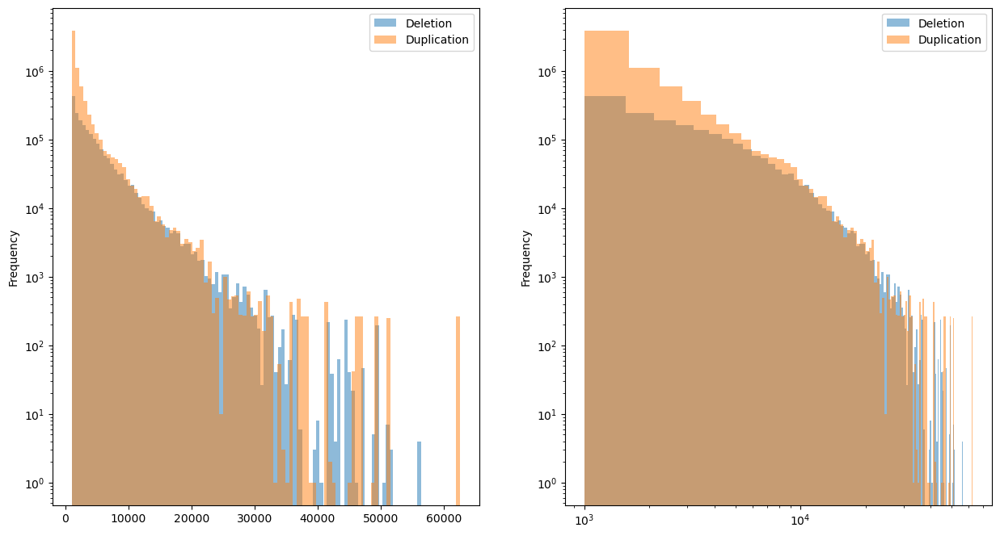

In [13]:
fig, axs = plt.subplots(1, 2, figsize=(15, 8))

df_plot= distribution.groupby(['type'])['Length']

df_plot.plot(kind='hist',stacked=True, bins=100, legend=True, ax=axs[0], log=True, alpha=0.5) # alpha for transparency

plt.xscale('log')
#plt.show()

df_plot = distribution.groupby(['type'])['Length']

df_plot.plot(kind='hist',stacked=True, bins=100, legend=True, ax=axs[1], log=True, alpha=0.5) # alpha for transparency

plt.show()

In [14]:
chm13.columns = ['Chromosome','Start','End','CNVR_ID,','Sample_ID','CNV_Start','CNV_End','CNV_Value','Length','Sample','Region', 'Lenght']

In [15]:
chm13

,Chromosome,Start,End,"CNVR_ID,",Sample_ID,CNV_Start,CNV_End,CNV_Value,Length,Sample,Region,Lenght
1282,18,2474470.0,2489257.0,CNVR_106169,LP6005442-DNA_A11,2474470,2482601,1,8132,LP6005442-DNA_A11,WestEurasia,14787.0
1283,18,3561572.0,3618743.0,CNVR_106221,LP6005442-DNA_A11,3597925,3601963,1,4039,LP6005442-DNA_A11,WestEurasia,57171.0
1284,18,5313061.0,5362042.0,CNVR_106309,LP6005442-DNA_A11,5320430,5325010,1,4581,LP6005442-DNA_A11,WestEurasia,48981.0
1285,18,6319892.0,6359141.0,CNVR_106371,LP6005442-DNA_A11,6339160,6340761,1,1602,LP6005442-DNA_A11,WestEurasia,39249.0
1286,18,7212069.0,7288329.0,CNVR_106429,LP6005442-DNA_A11,7229533,7231965,1,2433,LP6005442-DNA_A11,WestEurasia,76260.0
...,...,...,...,...,...,...,...,...,...,...,...,...
25767495,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248364795,248366351,29,1557,LP6005441-DNA_B09,EastAsia,82796.0
25767496,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248366351,248367622,30,1272,LP6005441-DNA_B09,EastAsia,82796.0
25767497,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248367622,248368745,27,1124,LP6005441-DNA_B09,EastAsia,82796.0
25767498,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248368745,248370339,43,1595,LP6005441-DNA_B09,EastAsia,82796.0


In [16]:
#change to df when using telomeres and centromeres filtration
final_cnv = chm13.pivot_table(index=["Chromosome", "Start", "End"], 
                    columns='Sample', 
                    values='CNV_Value',
                        fill_value=2).reset_index()


final_cnv

Sample,Chromosome,Start,End,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
0,1,436980.0,452948.0,2.0,6.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,6.0,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000
1,1,453948.0,466894.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,3.0,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000
2,1,472779.0,484339.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000
3,1,485339.0,511499.0,2.0,3.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000
4,1,518975.0,605035.0,2.0,3.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
177203,9,148749464.0,148769018.0,1.0,1.0,3.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,3.000000,3.000000,3.090909,3.000000,3.000000,2.000000
177204,9,149485872.0,149619213.0,1.0,1.0,1.0,2.0,3.0,2.0,2.0,...,1.0,2.0,1.0,2.0,2.000000,2.380952,3.020833,1.444444,2.166667,0.833333
177205,9,149620306.0,149794372.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,...,1.0,1.0,1.0,2.0,2.636364,2.666667,3.166667,2.166667,2.526316,1.000000
177206,9,149796085.0,149801998.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.000000,2.000000,3.000000,2.000000,2.000000,2.000000


<h1> Removing cnvs from exclusion regions 

In [17]:
black_header = ['Chromosome','Start', 'End', 'Type', 'Extra1', 'Extra2']
blacklist = pd.read_table('/Users/luciabazan/Downloads/T2T.excluderanges.bed', names=black_header)
blacklist['Chromosome'] = blacklist['Chromosome'].str.replace('chr', '')
blacklist = blacklist.drop(columns=['Extra1', 'Extra2'])
blacklist_ranges = PyRanges(blacklist)

/opt/anaconda3/lib/python3.11/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return {k: v for k, v in df.groupby(grpby_key)}


In [18]:
final_cnv_ranges = PyRanges(final_cnv)
final_cnv = final_cnv_ranges.overlap(blacklist_ranges, invert=True)
final_cnv = final_cnv.as_df()
cnvs = final_cnv
cnvs['Chromosome'] = 'chr' + cnvs['Chromosome'].astype(str)
cnvs.to_csv('../data/T2TCHM13_cnvs.csv')
final_cnv

/opt/anaconda3/lib/python3.11/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return {k: v for k, v in df.groupby(grpby_key)}


Sample,Chromosome,Start,End,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
0,chr1,436980,452948,2.0,6.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,6.0,2.0,2.0,2.0,2.0,2.0,2.0
1,chr1,453948,466894,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0
2,chr1,472779,484339,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
3,chr1,485339,511499,2.0,3.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
4,chr1,518975,605035,2.0,3.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
172654,chr18,76275159,76278412,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
172655,chr18,76280220,76283528,2.0,2.0,3.0,2.0,3.0,2.0,2.0,...,2.0,3.0,2.0,3.0,3.0,3.0,3.0,3.0,3.0,2.0
172656,chr18,76284798,76302290,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0
172657,chr18,76304864,76328399,2.0,2.0,1.0,1.0,2.0,2.0,2.0,...,2.0,2.0,2.0,3.0,2.0,2.0,1.0,2.0,2.0,2.0


In [21]:
d = final_cnv.fillna(2)
#d.to_csv('../data/t2tchm13_cnvr_cnv_values.csv', index=False) 
# I saved also ('../data/t2tchm13_cnvr_pivot.bed', sep='\t', header=None, index=False)
d

Sample,Chromosome,Start,End,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
0,chr1,436980,452948,2.0,6.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,6.0,2.0,2.0,2.0,2.0,2.0,2.0
1,chr1,453948,466894,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0
2,chr1,472779,484339,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
3,chr1,485339,511499,2.0,3.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
4,chr1,518975,605035,2.0,3.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
172654,chr18,76275159,76278412,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
172655,chr18,76280220,76283528,2.0,2.0,3.0,2.0,3.0,2.0,2.0,...,2.0,3.0,2.0,3.0,3.0,3.0,3.0,3.0,3.0,2.0
172656,chr18,76284798,76302290,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0
172657,chr18,76304864,76328399,2.0,2.0,1.0,1.0,2.0,2.0,2.0,...,2.0,2.0,2.0,3.0,2.0,2.0,1.0,2.0,2.0,2.0


Sample,Chromosome,Start,End,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
0,chrchr1,436980,452948,2.0,6.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,6.0,2.0,2.0,2.0,2.0,2.0,2.0
1,chrchr1,453948,466894,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0
2,chrchr1,472779,484339,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
3,chrchr1,485339,511499,2.0,3.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
4,chrchr1,518975,605035,2.0,3.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
172654,chrchr18,76275159,76278412,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
172655,chrchr18,76280220,76283528,2.0,2.0,3.0,2.0,3.0,2.0,2.0,...,2.0,3.0,2.0,3.0,3.0,3.0,3.0,3.0,3.0,2.0
172656,chrchr18,76284798,76302290,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0
172657,chrchr18,76304864,76328399,2.0,2.0,1.0,1.0,2.0,2.0,2.0,...,2.0,2.0,2.0,3.0,2.0,2.0,1.0,2.0,2.0,2.0


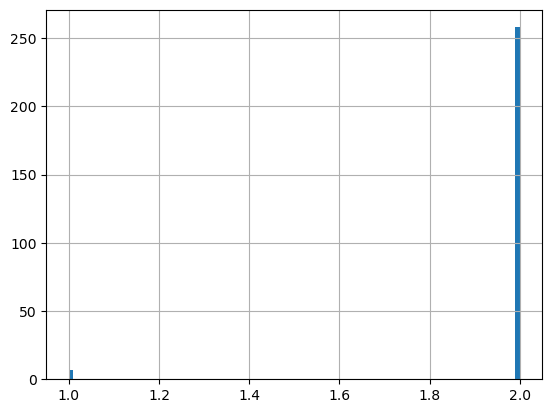

In [22]:
d.iloc[81275,4:280].hist(bins=100)
d['Chromosome'] = 'chr' + d['Chromosome'].astype(str)
d

In [23]:
## Saving CNVs coordinates as bed file to liftover
d.iloc[:,0:4].to_csv('cnvrs_coordinates_chm13t2t.bed', header=False, index=False,sep='\t')

In [24]:
columns = d.columns
np.savetxt("../data/t2tchm13_cnvrs_pivot_names.bed", columns,
           delimiter ="/t", 
           fmt ='% s')

In [28]:
(counts.max()).max()

852.0

<h1> PCA 

In [25]:
counts = final_cnv.iloc[:,4:287].T
features = ids_hg19.set_index('Sample').merge(counts, left_index=True, right_index=True)
features = features.loc[:,['Region']]
features = features.sort_index()
features 

,Region
Sample,
LP6005441-DNA_A03,Oceania
LP6005441-DNA_A04,America
LP6005441-DNA_A05,WestEurasia
LP6005441-DNA_A06,WestEurasia
LP6005441-DNA_A08,Africa
...,...
LP6007069-DNA_A01,WestEurasia
SS6004471,Africa
SS6004477,Oceania


<h1> VST

In [312]:
#coordinates = input_vst.iloc[:,0:2]
cnvs = final_cnv.iloc[:,4:287]
cnvs = cnvs.T
cnvs = cnvs.fillna(2)
cnvs

,0,1,2,3,4,5,6,7,8,9,...,172649,172650,172651,172652,172653,172654,172655,172656,172657,172658
Sample,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A03,6.0,2.0,2.0,3.0,3.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A04,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,1.0,2.0
LP6005441-DNA_A05,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0
LP6005441-DNA_A06,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0
LP6005441-DNA_A08,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0
SS6004471,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,1.0,2.0,2.0,2.0,3.0,1.0,1.0,1.0
SS6004477,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0


In [313]:
dt = features.merge(cnvs, left_index=True, right_index=True)
dt

,Region,0,1,2,3,4,5,6,7,8,...,172649,172650,172651,172652,172653,172654,172655,172656,172657,172658
Sample,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A03,Oceania,6.0,2.0,2.0,3.0,3.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A04,America,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,1.0,2.0
LP6005441-DNA_A05,WestEurasia,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0
LP6005441-DNA_A06,WestEurasia,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0
LP6005441-DNA_A08,Africa,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,WestEurasia,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0
SS6004471,Africa,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,1.0,2.0,2.0,2.0,3.0,1.0,1.0,1.0
SS6004477,Oceania,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0


<h1> New Vst

In [314]:
####### Groupby regions #######
dt_group = dt.groupby('Region')

dt_groupped = []
regions = features['Region'].unique()
regions.sort()
for i in regions:
    dt_groupped.append(dt_group.get_group(str(i)))

In [315]:
#### Names to pair-population
regions = dt['Region'].unique()
regions.sort()
combination_names = []
for i in list(combinations(regions,2)):
    combination_names.append(i[0]+str('-')+i[1])

for j in dt_groupped:
    del j['Region']

#dt_groupped

In [316]:
## Function for Vst 
def vst_function(
    x=None, 
    y=None):

    vx = np.var(x, axis=0)
    vy = np.var(y, axis=0)

    nx = len(x)
    ny = len(y)

## Vt 
    a = np.concatenate((x,y))
    vt = np.ndarray.var(a,axis=0)

### Vs = (V1*n1+V2*n2)/(n1+n2) 

    v1 = vx*nx
    v2 = vy*ny
    ns = nx+ny
    vs = (v1+v2)/ ns
    ########## Vst #################
    #####(VT−VS)/VT
    
    vst = (vt-vs)/vt
    
    return(vst) 


combination_regions = list(combinations([0,1,2,3,4,5,6],2))

vst_list = []
for region in combination_regions:
    vx = np.var(dt_groupped[region[0]])
    vy = np.var(dt_groupped[region[1]])

    nx = len(dt_groupped[region[0]])
    ny = len(dt_groupped[region[1]])

## Vt 
    a = np.concatenate((dt_groupped[region[0]], dt_groupped[region[1]]))
    vt = np.ndarray.var(a,axis=0)

### Vs = (V1*n1+V2*n2)/(n1+n2) 

    v1 = vx*nx
    v2 = vy*ny
    ns = nx+ny
    vs = (v1+v2)/ ns
    ########## Vst #################
    #####(VT−VS)/VT
    
    vst = (vt-vs)/vt
    
    vst_list.append(vst)

/opt/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3785: FutureWarning: The behavior of DataFrame.var with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return var(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


In [339]:
## VST for pair-population
vst_dt = []

combination_regions = list(combinations([0,1,2,3,4,5,6],2))
for region in combination_regions:
        statistic = vst_function((dt_groupped[region[0]]), (dt_groupped[region[1]]))
        vst_dt.append(statistic)

vst_dt = pd.DataFrame(vst_dt).set_axis(combination_names)
vst_dt

,0,1,2,3,4,5,6,7,8,9,...,172649,172650,172651,172652,172653,172654,172655,172656,172657,172658
Africa-America,0.012864,0.008130,NaN,NaN,NaN,0.025231,NaN,0.008130,NaN,0.008130,...,NaN,NaN,0.034232,NaN,0.034232,NaN,0.006509,0.000007,0.000635,0.039518
Africa-CentralAsiaSiberia,0.001431,0.009829,NaN,NaN,NaN,0.000003,NaN,0.009829,NaN,0.014013,...,NaN,NaN,0.041159,NaN,0.005902,0.022664,0.019083,0.000783,0.005195,0.034452
Africa-EastAsia,0.002910,0.012912,NaN,NaN,0.010719,0.000163,NaN,0.012912,NaN,0.012912,...,NaN,NaN,0.062879,NaN,0.007522,NaN,0.002739,0.026132,0.004447,0.010071
Africa-Oceania,0.002894,0.008904,NaN,0.028295,0.028295,0.027589,NaN,0.008904,NaN,0.008904,...,NaN,NaN,0.037398,NaN,0.012271,NaN,0.020964,0.018096,0.003390,0.013860
Africa-SouthAsia,0.005073,0.011882,NaN,NaN,NaN,0.011401,NaN,0.011882,NaN,0.011882,...,NaN,NaN,0.049431,NaN,0.000163,NaN,0.012505,0.024073,0.003259,0.031444
Africa-WestEurasia,0.000141,0.015601,0.005202,NaN,0.005202,0.015492,0.005202,0.015601,0.005202,0.019237,...,0.005202,0.010088,0.056046,0.005202,0.027040,0.005202,0.013500,0.020580,0.000921,0.052456
America-CentralAsiaSiberia,0.024771,NaN,NaN,NaN,NaN,0.032922,NaN,NaN,NaN,0.032922,...,NaN,NaN,NaN,NaN,0.068906,0.016103,0.003030,0.001008,0.013995,0.005291
America-EastAsia,0.004537,NaN,NaN,NaN,0.006944,0.021505,NaN,NaN,NaN,NaN,...,NaN,NaN,0.006944,NaN,0.053640,NaN,0.000949,0.035156,0.009899,0.025840
America-Oceania,0.005236,NaN,NaN,0.020704,0.020704,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.089186,NaN,0.004253,0.027381,0.011320,0.020704
America-SouthAsia,0.002948,NaN,NaN,NaN,NaN,0.009234,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.038986,NaN,0.000627,0.033333,0.001271,0.009234


In [340]:
filtering_vst = pd.DataFrame(vst_dt)>=0.2
filtering_vst = filtering_vst.loc[:, filtering_vst.any()]
#filtering_vst = filtering_vst.set_axis(combination_names)
filtering_vst

,2859,2973,3181,3260,3269,3287,3338,3342,3378,3529,...,172241,172242,172248,172257,172260,172262,172294,172298,172409,172609
Africa-America,False,False,False,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Africa-CentralAsiaSiberia,False,False,False,False,True,False,False,False,False,False,...,False,False,False,True,False,False,False,False,False,False
Africa-EastAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Africa-Oceania,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Africa-SouthAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Africa-WestEurasia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
America-CentralAsiaSiberia,False,True,True,True,False,True,True,False,True,False,...,False,False,False,False,True,False,True,False,True,False
America-EastAsia,False,False,False,False,False,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
America-Oceania,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,False,False
America-SouthAsia,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [341]:
## Coordinates anotation 
vst_dt = vst_dt.T
vst_dt.insert (0, 'Chromosome', final_cnv['Chromosome'])
vst_dt.insert (1, 'Start', final_cnv['Start'])
vst_dt.insert (2, 'End', final_cnv['End'])
#vst_dt.insert (3, 'Type', final_cnv['Type'])
vst_dt = vst_dt.round(5)
vst_dt = vst_dt.replace(np.NaN, 0)
vst_dt

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia
0,chr1,436980,452948,0.01286,0.00143,0.00291,0.00289,0.00507,0.00014,0.02477,...,0.00833,0.00881,0.01210,0.00053,0.00001,0.00032,0.00392,0.00020,0.00319,0.00583
1,chr1,453948,466894,0.00813,0.00983,0.01291,0.00890,0.01188,0.01560,0.00000,...,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
2,chr1,472779,484339,0.00000,0.00000,0.00000,0.00000,0.00000,0.00520,0.00000,...,0.00000,0.00000,0.00000,0.00392,0.00000,0.00000,0.00551,0.00000,0.00348,0.00496
3,chr1,485339,511499,0.00000,0.00000,0.00000,0.02830,0.00000,0.00000,0.00000,...,0.00000,0.02396,0.00000,0.00000,0.02920,0.00000,0.00000,0.02754,0.03319,0.00000
4,chr1,518975,605035,0.00000,0.00000,0.01072,0.02830,0.00000,0.00520,0.00000,...,0.00845,0.02396,0.00000,0.00392,0.00354,0.01030,0.01815,0.02754,0.02878,0.00496
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
172654,chr18,76275159,76278412,0.00000,0.02266,0.00000,0.00000,0.00000,0.00520,0.01610,...,0.02347,0.01738,0.02199,0.02556,0.00000,0.00000,0.00551,0.00000,0.00348,0.00496
172655,chr18,76280220,76283528,0.00651,0.01908,0.00274,0.02096,0.01250,0.01350,0.00303,...,0.00741,0.00009,0.00084,0.00033,0.00870,0.00353,0.00446,0.00143,0.00067,0.00007
172656,chr18,76284798,76302290,0.00001,0.00078,0.02613,0.01810,0.02407,0.02058,0.00101,...,0.02347,0.01738,0.02199,0.01278,0.00000,0.00000,0.00183,0.00000,0.00115,0.00164
172657,chr18,76304864,76328399,0.00064,0.00520,0.00445,0.00339,0.00326,0.00092,0.01399,...,0.00009,0.00021,0.02539,0.00131,0.00002,0.02109,0.00101,0.02085,0.00056,0.00737


In [342]:
vst_dt.to_csv('../data/vst_cnvr_results_t2tchm13.csv', index=False)

In [343]:
vst_dt_filtered = vst_dt.iloc[filtering_vst.T.index]
vst_dt_filtered#.sort_values(by=['WestEurasia-Oceania'], ascending=False).head(50)
vst_dt_filtered.to_csv('vst_cnvr_candidates_chm13t2t.csv', index=False)
vst_dt_filtered

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia
2859,chr1,4119209,4123876,0.00358,0.07555,0.00279,0.01831,0.13432,0.06417,0.13336,...,0.05204,0.02944,0.02199,0.00108,0.00745,0.10270,0.04197,0.08546,0.01125,0.01342
2973,chr1,5373793,5375048,0.11646,0.15901,0.04903,0.00529,0.01122,0.00745,0.46901,...,0.31681,0.26430,0.09410,0.08024,0.02359,0.10044,0.08628,0.03249,0.02018,0.00023
3181,chr1,7884464,7898408,0.00137,0.19214,0.00663,0.00171,0.07493,0.01380,0.20801,...,0.11424,0.12990,0.04874,0.08173,0.00089,0.03247,0.00126,0.03888,0.00345,0.01988
3260,chr1,9027078,9126952,0.11322,0.15759,0.04063,0.02407,0.00195,0.00094,0.36415,...,0.24823,0.24866,0.14259,0.09496,0.00176,0.01992,0.04695,0.00919,0.02439,0.00466
3269,chr1,9285874,9351410,0.23644,0.27229,0.04292,0.00510,0.09830,0.01985,0.00460,...,0.10146,0.18713,0.05719,0.14793,0.01534,0.00937,0.00508,0.04876,0.00374,0.02938
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
172262,chr18,66465013,66585794,0.10172,0.14927,0.04288,0.01066,0.08840,0.11119,0.01452,...,0.05703,0.22360,0.02166,0.02464,0.09175,0.01185,0.01586,0.15292,0.17402,0.00001
172294,chr18,67974136,67991293,0.04005,0.07557,0.01498,0.00284,0.00030,0.04565,0.23625,...,0.03529,0.07493,0.07226,0.00018,0.00418,0.01115,0.01706,0.00141,0.02301,0.03944
172298,chr18,68041106,68075150,0.01920,0.04145,0.07662,0.00000,0.04574,0.02373,0.00489,...,0.19574,0.04368,0.00000,0.00099,0.06939,0.21308,0.15132,0.04452,0.01880,0.00124
172409,chr18,71524229,71548201,0.01152,0.10119,0.00651,0.00115,0.00353,0.00841,0.20801,...,0.06210,0.10336,0.06024,0.04435,0.00186,0.00026,0.00017,0.00062,0.00262,0.00078


In [344]:
#vst_dt_filtered.sort_values(by='Africa-America', ascending=False).head(50)

In [345]:
ls = []
for index,row in vst_dt_filtered.iterrows():
    if (row['Africa-America'] > 0.2 and row['Africa-Oceania'] < 0.2 and row['Africa-CentralAsiaSiberia'] < 0.2):
        ls.append(row)

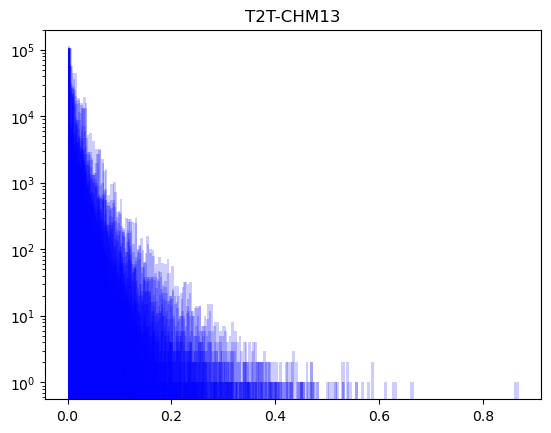

In [346]:
#sns.set_palette("bright")
for i in vst_dt.iloc[:,4:25].columns:
    plt.hist(vst_dt[i], bins=100, alpha=0.2, log=True,color="blue")
    plt.title('T2T-CHM13')
    plt.savefig('../plots/t2t_chm13_vst_values_distribution.png', transparent=True)

/opt/anaconda3/lib/python3.11/site-packages/pandas/plotting/_matplotlib/tools.py:225: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(**fig_kw)


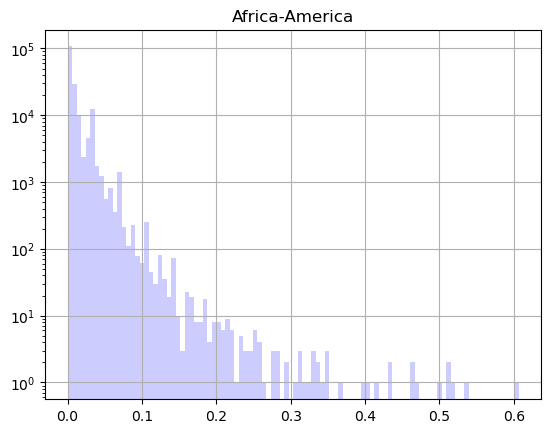

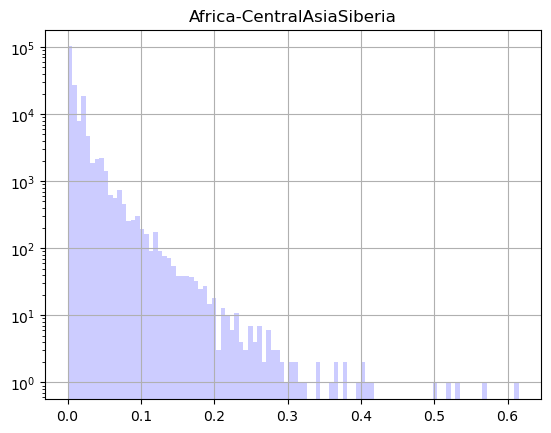

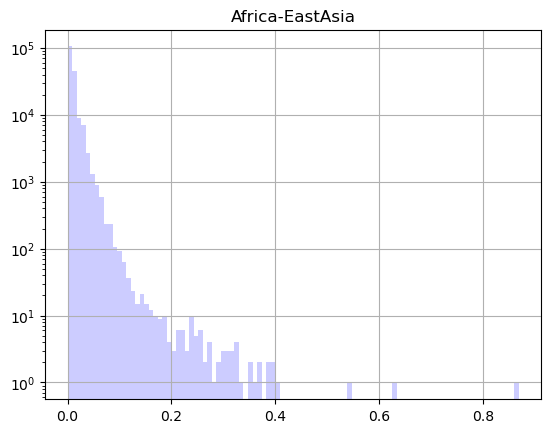

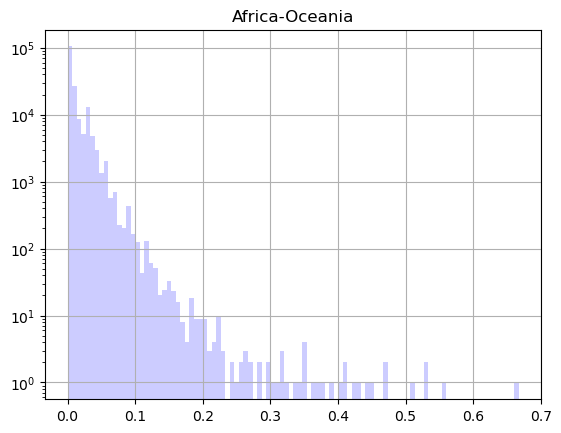

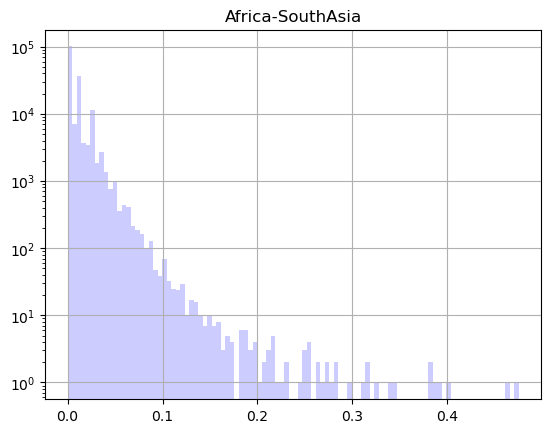

...

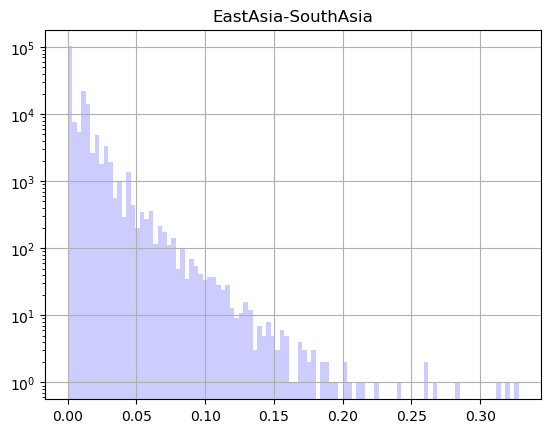

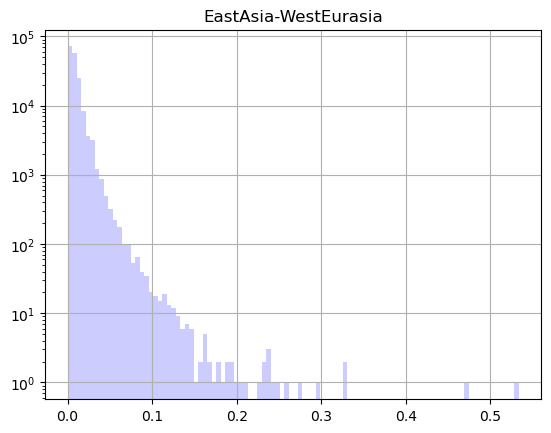

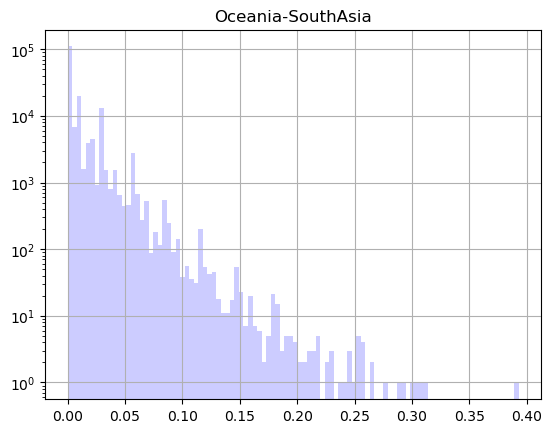

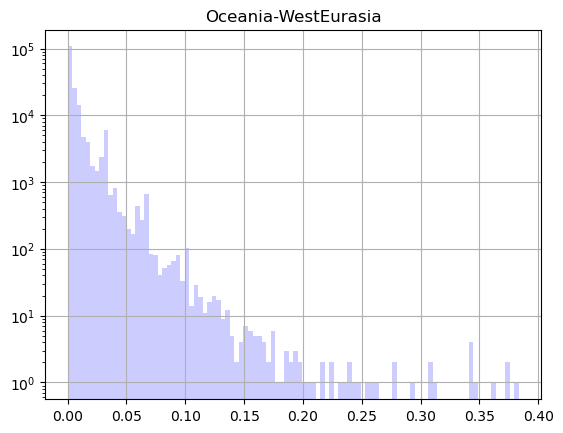

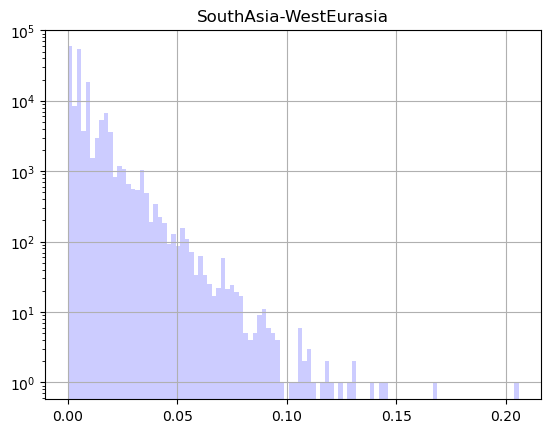

In [347]:
for col in vst_dt.iloc[:,3:25].columns: 
    try:      
        vst_dt.iloc[:,3:25][col] = pd.to_numeric(vst_dt.iloc[:,3:25][col]) 
        vst_dt.iloc[:,3:25].hist(column=col, bins=100, alpha=0.2, color="blue", log=True)
    except ValueError:
        print('This column can not be represented as a histogram')

<Axes: >

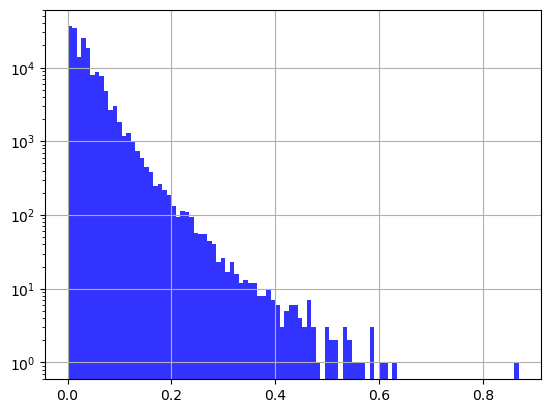

In [326]:
vst_dt.iloc[:,3:25].max(axis=1).hist(bins=100, alpha=0.8, log=True, color="blue")

In [327]:
#vst_dt[vst_dt['Type']=='duplication'].sort_values(by='Oceania-WestEurasia', ascending=False).head(200)

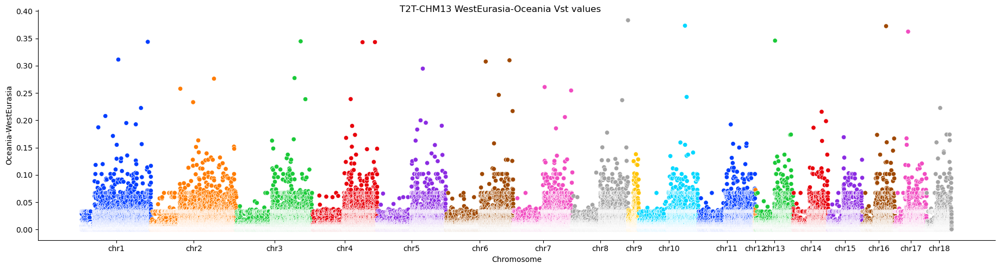

In [328]:
# Simulate DataFrame
#vst_dt['i']= vst_dt.index
vst_dt["i"] = pd.to_numeric(vst_dt.index, downcast="float")

#vst_dt['log_West_Oceania'] = np.log2(vst_dt['WestEurasia-Oceania'])

# Generate Manhattan plot: (#optional tweaks for relplot: linewidth=0, s=9)
plot = sns.relplot(data=vst_dt, x='i', y='Oceania-WestEurasia', aspect=3.7, 
                  hue='Chromosome', palette = 'bright', legend=None) 
chrom_df=vst_dt.groupby('Chromosome')['i'].median()
plot.ax.set_xlabel('Chromosome'); plot.ax.set_xticks(chrom_df);
plot.ax.set_xticklabels(chrom_df.index)
plot.fig.suptitle('T2T-CHM13 WestEurasia-Oceania Vst values');

In [329]:
vst_dt_filtered = vst_dt.iloc[filtering_vst.T.index]
vst_dt_filtered#.sort_values(by=['WestEurasia-Oceania'], ascending=False).head(50)

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia,i
2859,chr1,4119209,4123876,0.00358,0.07555,0.00279,0.01831,0.13432,0.06417,0.13336,...,0.02944,0.02199,0.00108,0.00745,0.10270,0.04197,0.08546,0.01125,0.01342,2859.0
2973,chr1,5373793,5375048,0.11646,0.15901,0.04903,0.00529,0.01122,0.00745,0.46901,...,0.26430,0.09410,0.08024,0.02359,0.10044,0.08628,0.03249,0.02018,0.00023,2973.0
3181,chr1,7884464,7898408,0.00137,0.19214,0.00663,0.00171,0.07493,0.01380,0.20801,...,0.12990,0.04874,0.08173,0.00089,0.03247,0.00126,0.03888,0.00345,0.01988,3181.0
3260,chr1,9027078,9126952,0.11322,0.15759,0.04063,0.02407,0.00195,0.00094,0.36415,...,0.24866,0.14259,0.09496,0.00176,0.01992,0.04695,0.00919,0.02439,0.00466,3260.0
3269,chr1,9285874,9351410,0.23644,0.27229,0.04292,0.00510,0.09830,0.01985,0.00460,...,0.18713,0.05719,0.14793,0.01534,0.00937,0.00508,0.04876,0.00374,0.02938,3269.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
172262,chr18,66465013,66585794,0.10172,0.14927,0.04288,0.01066,0.08840,0.11119,0.01452,...,0.22360,0.02166,0.02464,0.09175,0.01185,0.01586,0.15292,0.17402,0.00001,172262.0
172294,chr18,67974136,67991293,0.04005,0.07557,0.01498,0.00284,0.00030,0.04565,0.23625,...,0.07493,0.07226,0.00018,0.00418,0.01115,0.01706,0.00141,0.02301,0.03944,172294.0
172298,chr18,68041106,68075150,0.01920,0.04145,0.07662,0.00000,0.04574,0.02373,0.00489,...,0.04368,0.00000,0.00099,0.06939,0.21308,0.15132,0.04452,0.01880,0.00124,172298.0
172409,chr18,71524229,71548201,0.01152,0.10119,0.00651,0.00115,0.00353,0.00841,0.20801,...,0.10336,0.06024,0.04435,0.00186,0.00026,0.00017,0.00062,0.00262,0.00078,172409.0


In [330]:
## Saving Vst coordinates as bed file to liftover

vst_dt_filtered.iloc[:,0:4].to_csv('vst_cnvrs_coordinates_chm13t2t.bed', header=False, index=False,sep='\t')
vst_dt_filtered

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia,i
2859,chr1,4119209,4123876,0.00358,0.07555,0.00279,0.01831,0.13432,0.06417,0.13336,...,0.02944,0.02199,0.00108,0.00745,0.10270,0.04197,0.08546,0.01125,0.01342,2859.0
2973,chr1,5373793,5375048,0.11646,0.15901,0.04903,0.00529,0.01122,0.00745,0.46901,...,0.26430,0.09410,0.08024,0.02359,0.10044,0.08628,0.03249,0.02018,0.00023,2973.0
3181,chr1,7884464,7898408,0.00137,0.19214,0.00663,0.00171,0.07493,0.01380,0.20801,...,0.12990,0.04874,0.08173,0.00089,0.03247,0.00126,0.03888,0.00345,0.01988,3181.0
3260,chr1,9027078,9126952,0.11322,0.15759,0.04063,0.02407,0.00195,0.00094,0.36415,...,0.24866,0.14259,0.09496,0.00176,0.01992,0.04695,0.00919,0.02439,0.00466,3260.0
3269,chr1,9285874,9351410,0.23644,0.27229,0.04292,0.00510,0.09830,0.01985,0.00460,...,0.18713,0.05719,0.14793,0.01534,0.00937,0.00508,0.04876,0.00374,0.02938,3269.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
172262,chr18,66465013,66585794,0.10172,0.14927,0.04288,0.01066,0.08840,0.11119,0.01452,...,0.22360,0.02166,0.02464,0.09175,0.01185,0.01586,0.15292,0.17402,0.00001,172262.0
172294,chr18,67974136,67991293,0.04005,0.07557,0.01498,0.00284,0.00030,0.04565,0.23625,...,0.07493,0.07226,0.00018,0.00418,0.01115,0.01706,0.00141,0.02301,0.03944,172294.0
172298,chr18,68041106,68075150,0.01920,0.04145,0.07662,0.00000,0.04574,0.02373,0.00489,...,0.04368,0.00000,0.00099,0.06939,0.21308,0.15132,0.04452,0.01880,0.00124,172298.0
172409,chr18,71524229,71548201,0.01152,0.10119,0.00651,0.00115,0.00353,0.00841,0.20801,...,0.10336,0.06024,0.04435,0.00186,0.00026,0.00017,0.00062,0.00262,0.00078,172409.0


<h1> Deletions 

In [331]:
cnv_passed_vst = cnvs.T.iloc[filtering_vst.T.index]
cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]<3).all(axis=1)]
counts = cnv_passed_vst.T
counts = counts.sort_index()
counts

,4068,4165,4698,4724,5401,5537,5664,6921,7519,9324,...,166318,166893,166924,169759,170522,170708,171118,172241,172248,172260
Sample,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A03,2.0,1.0,2.0,1.0,2.0,2.0,2.0,1.0,2.0,2.0,...,1.0,1.000000,2.0,2.0,1.0,2.0,2.0,2.0,2.0,1.0
LP6005441-DNA_A04,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,1.0,2.0,...,2.0,1.000000,2.0,2.0,2.0,1.0,2.0,2.0,1.0,1.0
LP6005441-DNA_A05,2.0,1.0,1.0,2.0,2.0,1.0,2.0,2.0,1.0,2.0,...,2.0,0.333333,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0
LP6005441-DNA_A06,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,...,2.0,2.000000,2.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0
LP6005441-DNA_A08,1.0,1.0,1.0,1.0,2.0,2.0,1.0,2.0,1.0,1.0,...,2.0,2.000000,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,2.0,1.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,1.0,...,2.0,1.000000,2.0,1.0,2.0,2.0,0.5,2.0,2.0,1.0
SS6004471,2.0,1.0,1.0,1.0,2.0,2.0,1.0,2.0,2.0,1.0,...,1.0,1.000000,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
SS6004477,2.0,1.0,2.0,1.0,2.0,2.0,1.0,1.0,1.0,1.0,...,2.0,1.000000,2.0,1.0,2.0,1.0,1.0,2.0,2.0,1.0


             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
Oceania         0.482727     1.756488     1.520064    -2.008944    -1.354115   
America        -3.773677    -2.781773     1.046859     6.079692    -0.537666   
WestEurasia    -2.107559     0.326122    -2.306827     2.488861     1.001738   
WestEurasia    -4.068555     0.481375    -1.176468     0.774945     0.194865   
Africa          1.619126     4.493389    -1.218895    -1.031757    -1.302664   
...                  ...          ...          ...          ...          ...   
WestEurasia     5.631385     1.063743     4.670707    -0.020147     5.008738   
Africa          2.276295     6.078028    10.711782     1.170134     3.937587   
Oceania         2.438745     2.012187    12.739742    -1.645790     1.828830   
Oceania         1.859638     2.956054    14.454676    -1.840514     0.853075   
Africa         -0.559952     8.356961   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:


Text(0.5, 1.0, 'T2T-CHM13 PCA deletions')

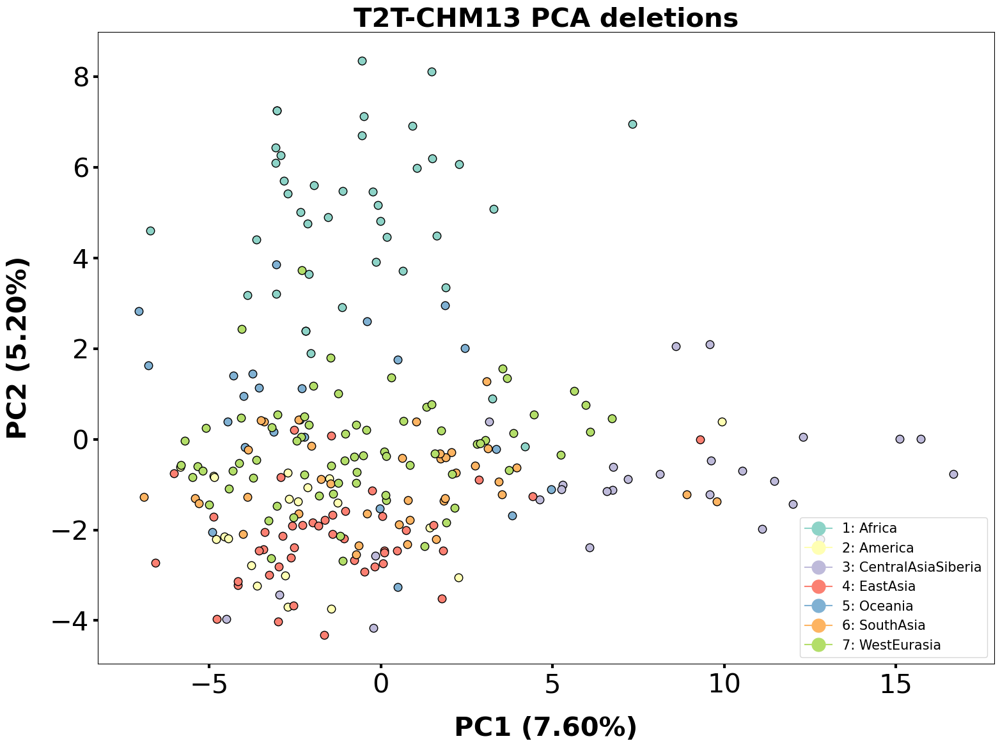

In [332]:
#PCA

x = StandardScaler().fit_transform(counts)
pca = PCA(n_components=10)
pca_results = pca.fit_transform(x)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)

plot_scatter_cluster(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (7.60%)', label_vertical='PC2 (5.20%)', factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("T2T-CHM13 PCA deletions", size=30, fontweight="bold")

## Removing CNVs with high variance 

cnv_high_variance = pd.DataFrame({'values':abs(pca.components_)[0], }).sort_values(by='values', ascending=False).head(150)
indexs = list(cnv_high_variance.index)
new_counts = counts.T.reset_index()

coordinates_high_variance = new_counts.iloc[indexs]
#coordinates_high_variance['index']
new_counts = new_counts.drop(new_counts.index[indexs])
#new_counts = new_counts.iloc[indexs]
new_counts = new_counts.drop(columns='index')
new_counts

             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
Oceania         0.482727     1.756488     1.520064    -2.008944    -1.354115   
America        -3.773677    -2.781773     1.046859     6.079692    -0.537666   
WestEurasia    -2.107559     0.326122    -2.306827     2.488861     1.001738   
WestEurasia    -4.068555     0.481375    -1.176468     0.774945     0.194865   
Africa          1.619126     4.493389    -1.218895    -1.031757    -1.302664   
...                  ...          ...          ...          ...          ...   
WestEurasia     5.631385     1.063743     4.670707    -0.020147     5.008738   
Africa          2.276295     6.078028    10.711782     1.170134     3.937587   
Oceania         2.438745     2.012187    12.739742    -1.645790     1.828830   
Oceania         1.859638     2.956054    14.454676    -1.840514     0.853075   
Africa         -0.559952     8.356961   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_

Count of groups by factor: 7
             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
Oceania         0.482727     1.756488     1.520064    -2.008944    -1.354115   
America        -3.773677    -2.781773     1.046859     6.079692    -0.537666   
WestEurasia    -2.107559     0.326122    -2.306827     2.488861     1.001738   
WestEurasia    -4.068555     0.481375    -1.176468     0.774945     0.194865   
Africa          1.619126     4.493389    -1.218895    -1.031757    -1.302664   
...                  ...          ...          ...          ...          ...   
WestEurasia     5.631385     1.063743     4.670707    -0.020147     5.008738   
Africa          2.276295     6.078028    10.711782     1.170134     3.937587   
Oceania         2.438745     2.012187    12.739742    -1.645790     1.828830   
Oceania         1.859638     2.956054    14.454676    -1.840514     0.853075   
Africa     

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv

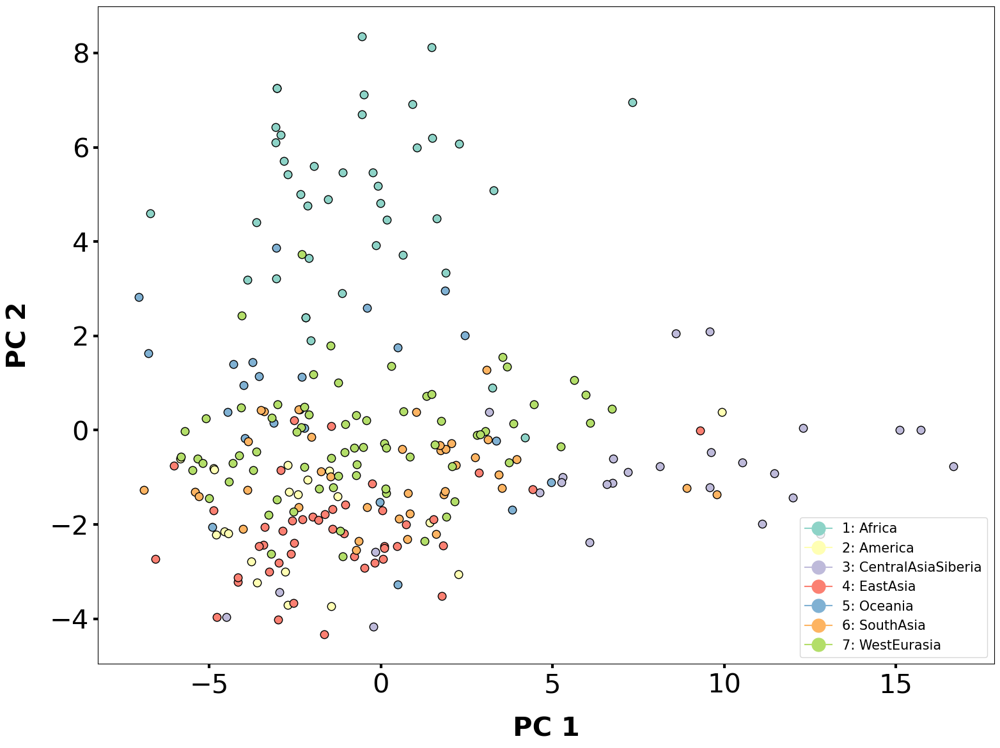

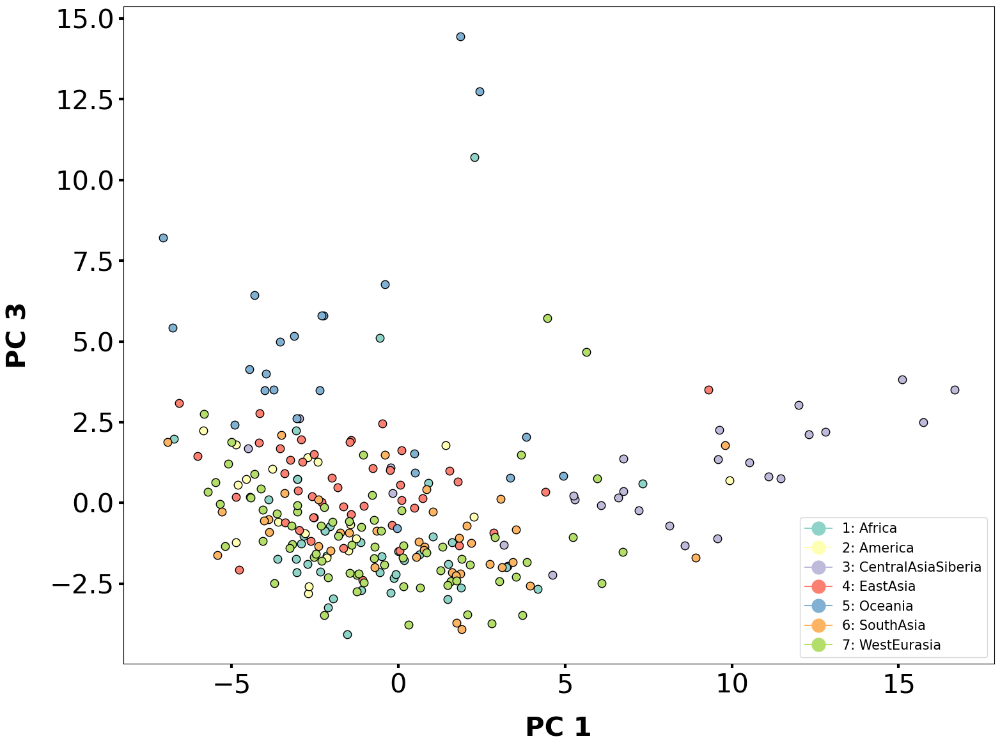

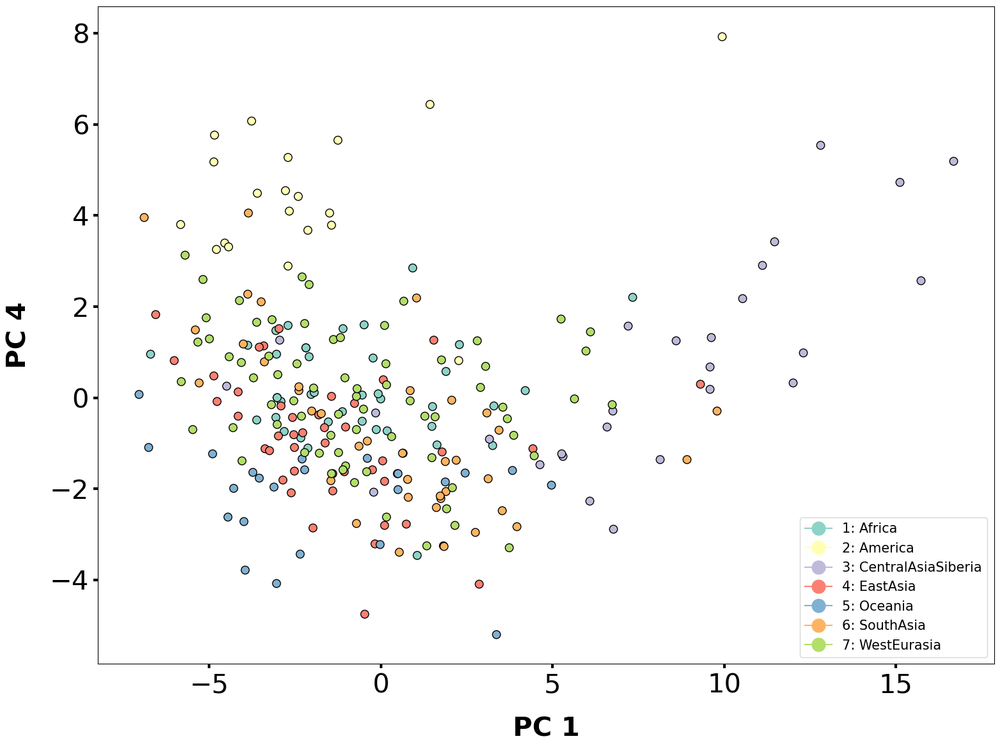

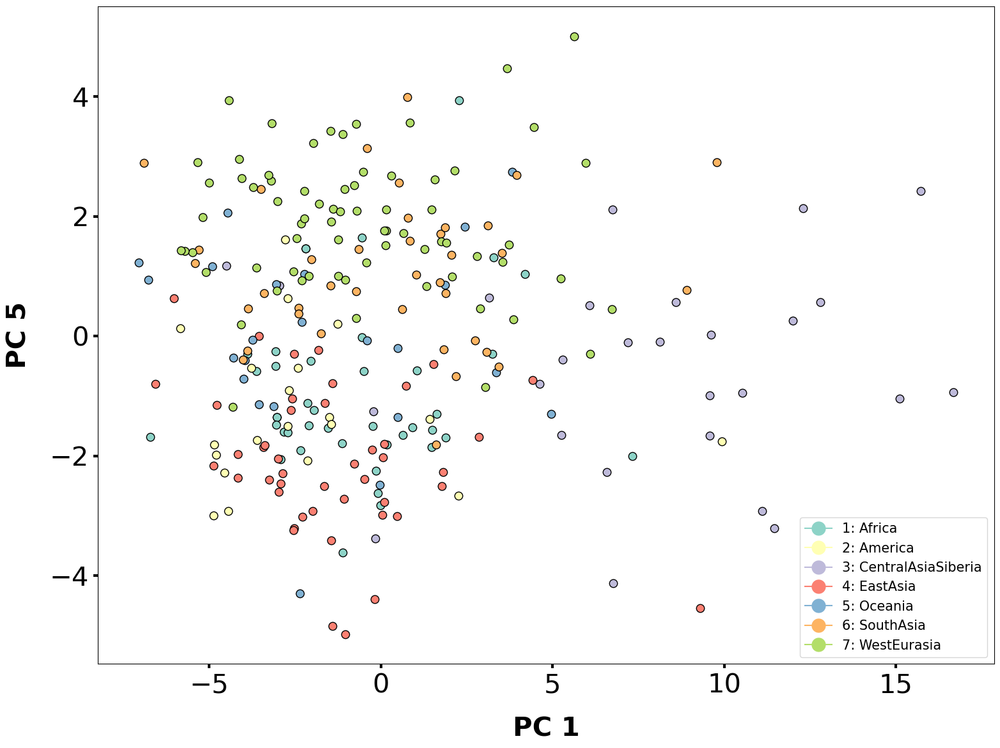

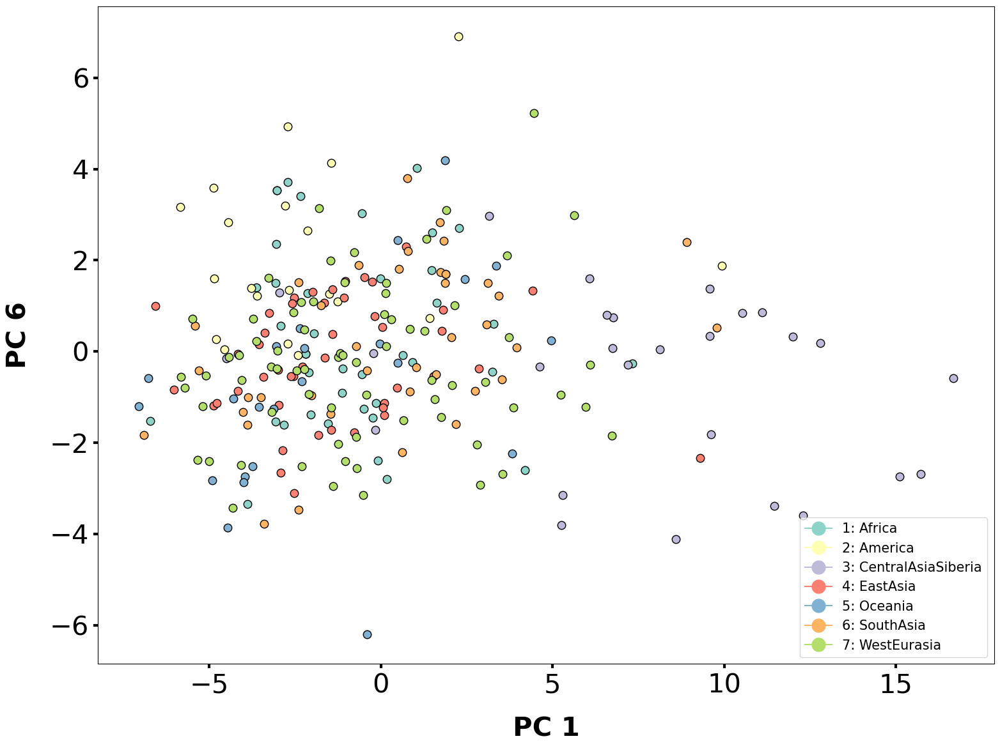

...

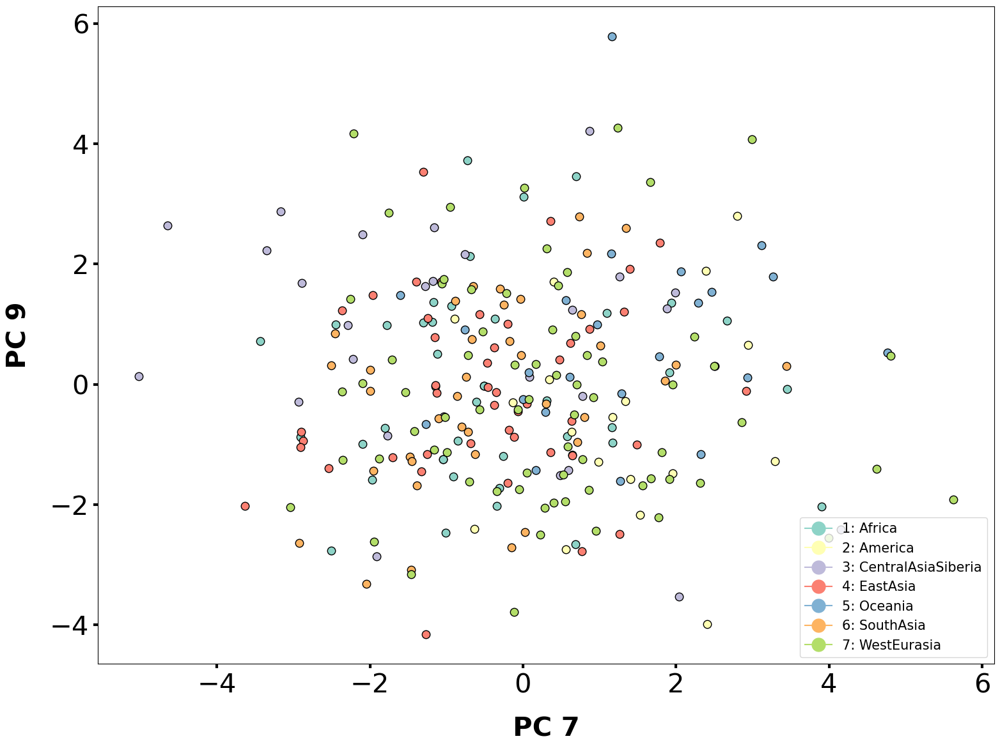

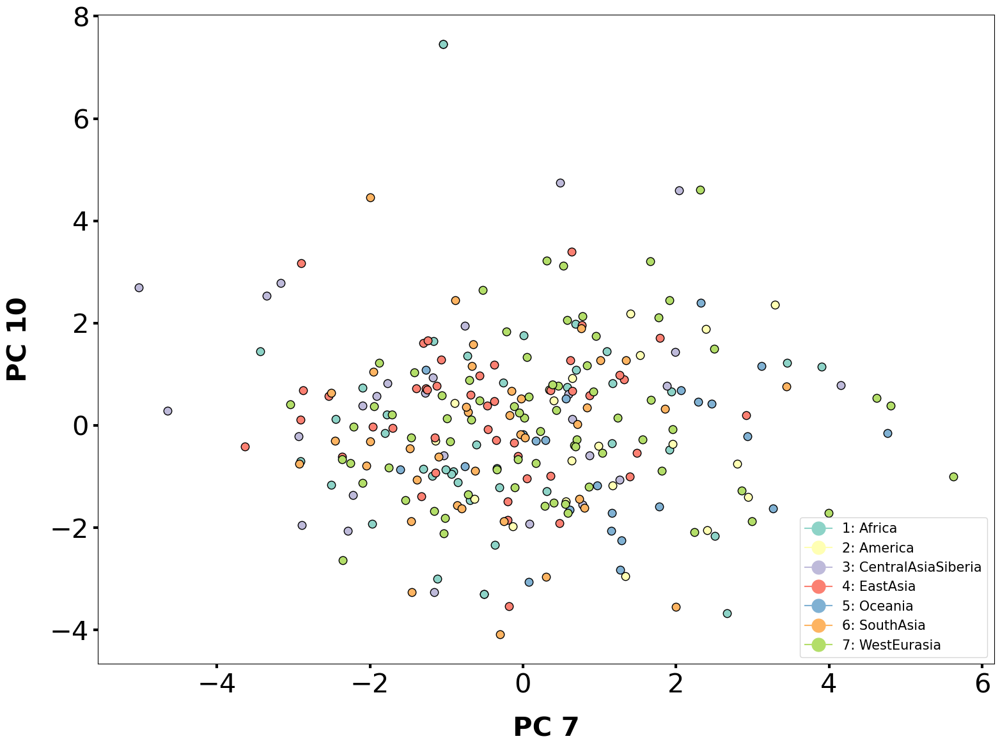

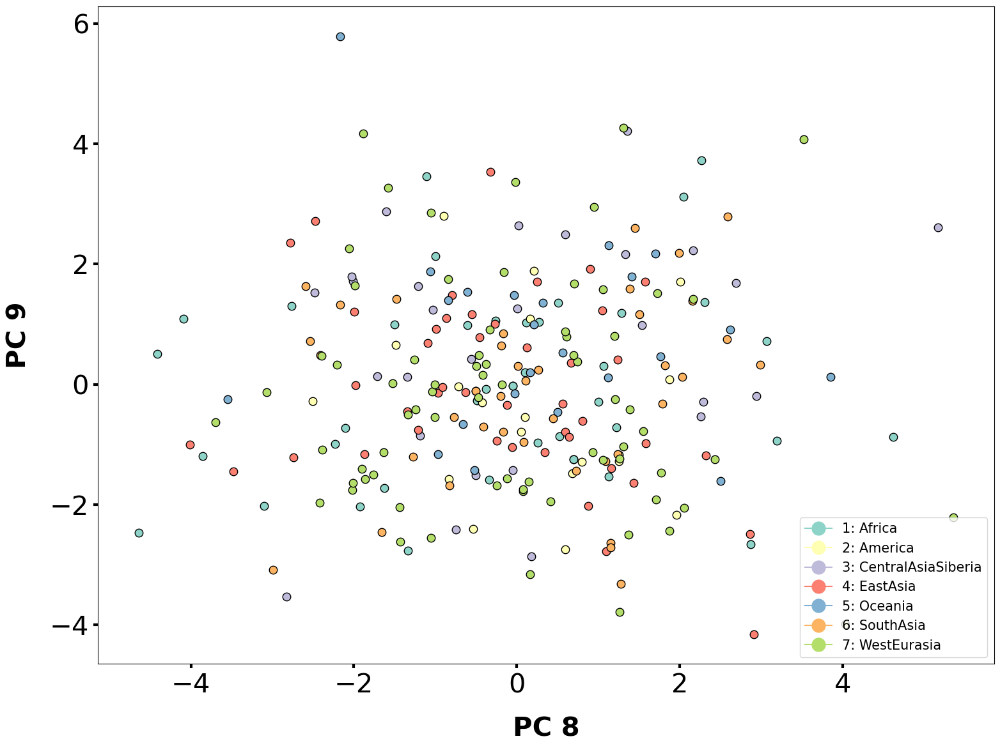

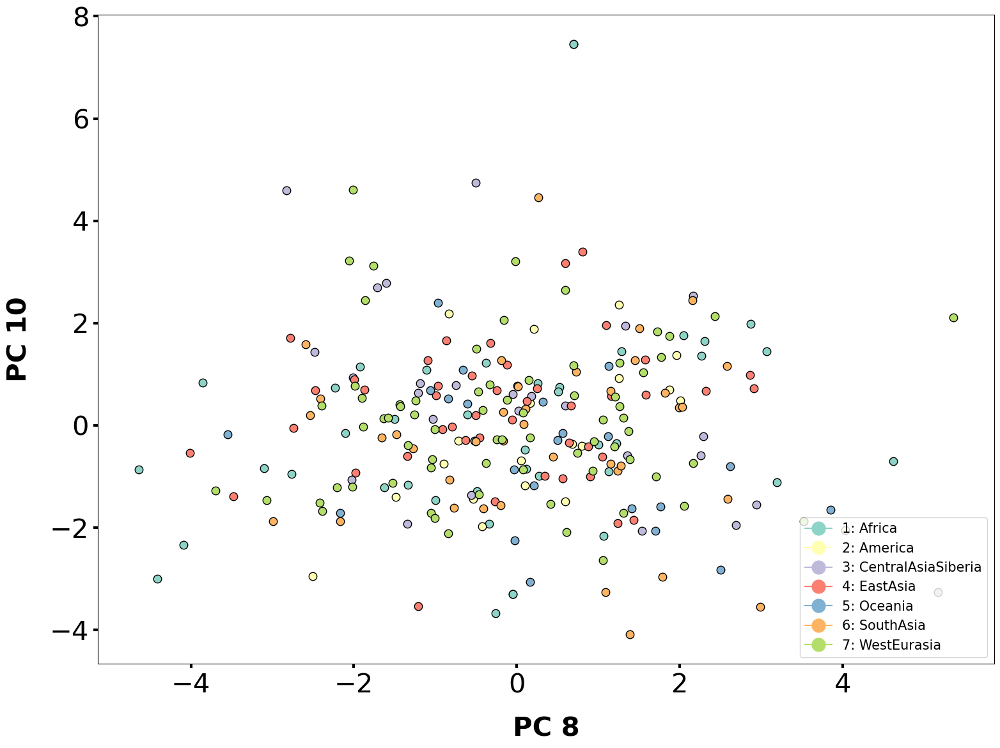

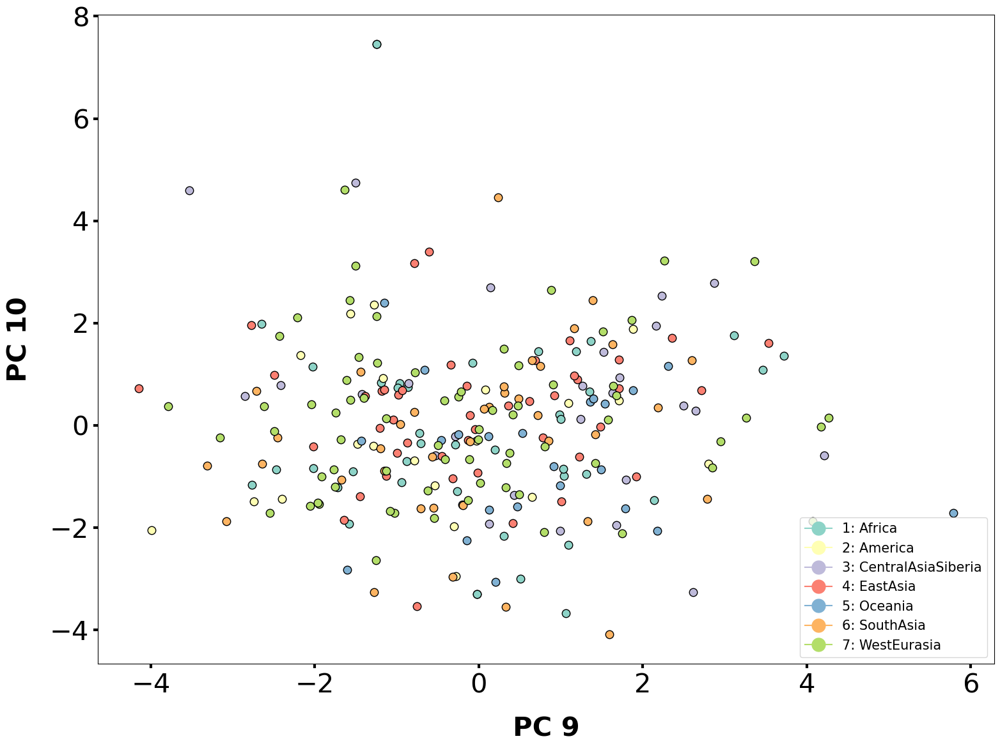

In [333]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))

             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
Oceania         0.482727     1.756488     1.520064    -2.008944    -1.354115   
America        -3.773677    -2.781773     1.046859     6.079692    -0.537666   
WestEurasia    -2.107559     0.326122    -2.306827     2.488861     1.001738   
WestEurasia    -4.068555     0.481375    -1.176468     0.774945     0.194865   
Africa          1.619126     4.493389    -1.218895    -1.031757    -1.302664   
...                  ...          ...          ...          ...          ...   
WestEurasia     5.631385     1.063743     4.670707    -0.020147     5.008738   
Africa          2.276295     6.078028    10.711782     1.170134     3.937587   
Oceania         2.438745     2.012187    12.739742    -1.645790     1.828830   
Oceania         1.859638     2.956054    14.454676    -1.840514     0.853075   
Africa         -0.559952     8.356961   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:


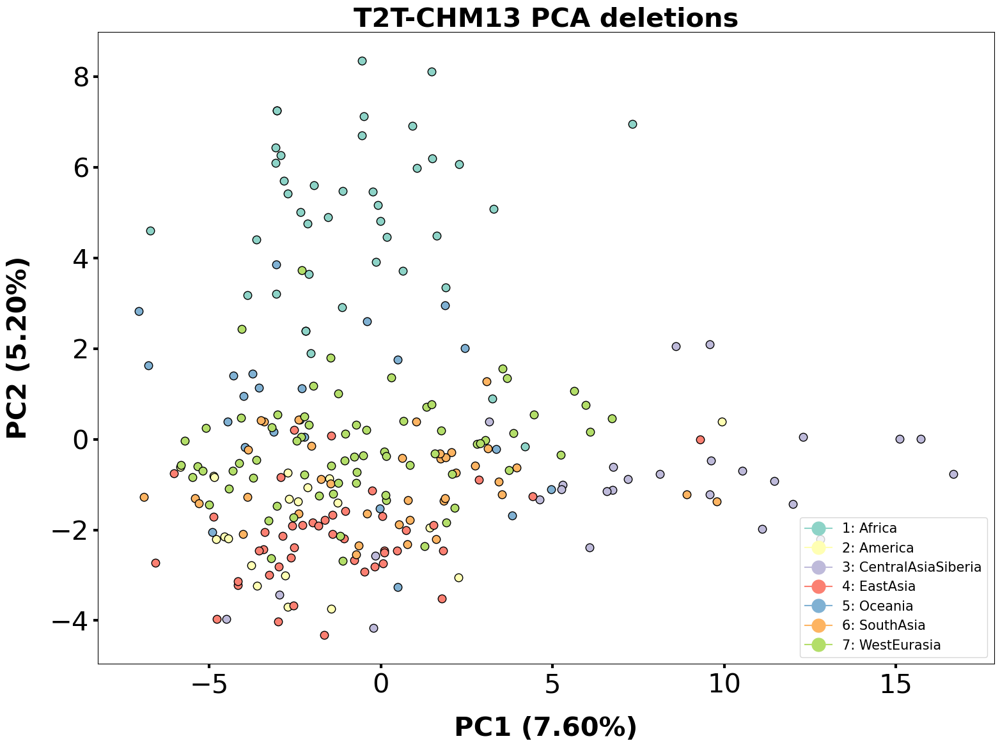

In [336]:
plot_scatter_cluster(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (7.60%)', label_vertical='PC2 (5.20%)', factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("T2T-CHM13 PCA deletions", size=30, fontweight="bold")

plt.savefig('../plots/t2t_chm13_pca_deletions_pc12_cnvr.png', transparent=True)

             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
Oceania         0.482727     1.756488     1.520064    -2.008944    -1.354115   
America        -3.773677    -2.781773     1.046859     6.079692    -0.537666   
WestEurasia    -2.107559     0.326122    -2.306827     2.488861     1.001738   
WestEurasia    -4.068555     0.481375    -1.176468     0.774945     0.194865   
Africa          1.619126     4.493389    -1.218895    -1.031757    -1.302664   
...                  ...          ...          ...          ...          ...   
WestEurasia     5.631385     1.063743     4.670707    -0.020147     5.008738   
Africa          2.276295     6.078028    10.711782     1.170134     3.937587   
Oceania         2.438745     2.012187    12.739742    -1.645790     1.828830   
Oceania         1.859638     2.956054    14.454676    -1.840514     0.853075   
Africa         -0.559952     8.356961   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:


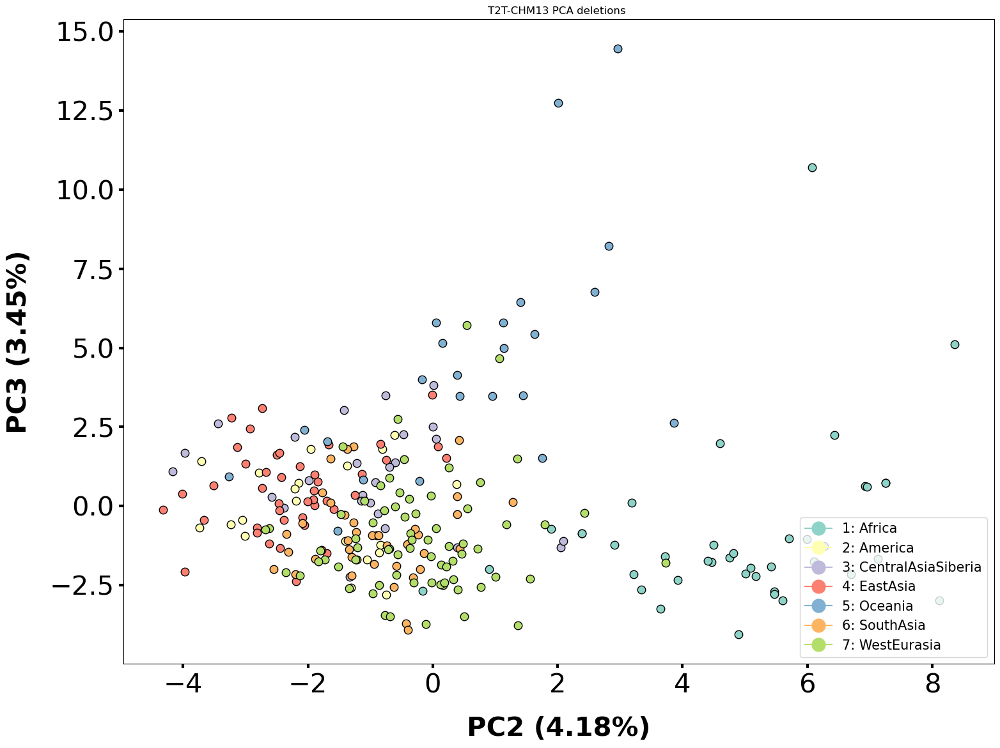

In [337]:
plot_scatter_cluster(data=df_pca, abscissa='component_2', ordinate='component_3', label_horizontal='PC2 (4.18%)', label_vertical='PC3 (3.45%)', factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("T2T-CHM13 PCA deletions ")

plt.savefig('../plots/t2t_chm13_pca_deletions_pc23_cnvr.png', transparent=True)

<h1> Duplications

In [154]:
cnv_passed_vst = cnvs.T.iloc[filtering_vst.T.index]

cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]>1).any(axis=1)]
cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]<5).all(axis=1)]
counts = cnv_passed_vst.T
counts = counts.sort_index()
counts

,2859,3181,3269,3287,3338,3342,3378,3529,4046,4068,...,172241,172242,172248,172257,172260,172262,172294,172298,172409,172609
Sample,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A03,2.0,2.0,1.0,2.0,2.0,2.0,1.000000,1.0,2.333333,2.0,...,2.0,2.0,2.0,1.000000,1.0,2.0,1.0,2.0,1.0,2.000000
LP6005441-DNA_A04,2.0,2.0,3.0,2.0,2.0,2.0,3.000000,2.0,3.000000,2.0,...,2.0,1.0,1.0,1.000000,1.0,2.0,2.0,2.0,1.0,2.000000
LP6005441-DNA_A05,2.0,1.0,3.0,2.0,2.0,2.0,3.000000,1.0,4.000000,2.0,...,1.0,1.0,2.0,1.000000,2.0,2.0,2.0,2.0,2.0,2.000000
LP6005441-DNA_A06,2.0,1.0,3.0,2.0,2.0,2.0,2.000000,2.0,3.500000,2.0,...,2.0,2.0,2.0,1.000000,1.0,2.0,2.0,1.0,2.0,2.000000
LP6005441-DNA_A08,2.0,2.0,2.0,2.0,2.0,1.0,2.000000,1.0,2.333333,1.0,...,2.0,2.0,2.0,0.500000,2.0,2.0,2.0,2.0,1.0,2.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,2.0,2.0,3.0,2.0,1.0,1.0,1.666667,2.0,2.666667,2.0,...,2.0,1.0,2.0,1.000000,1.0,2.0,1.0,2.0,2.0,1.250000
SS6004471,1.0,2.0,3.0,1.0,1.0,1.0,1.000000,1.0,2.666667,2.0,...,1.0,1.0,1.0,0.714286,1.0,1.0,2.0,1.0,2.0,0.750000
SS6004477,2.0,3.0,3.0,2.0,1.0,2.0,1.000000,3.0,2.666667,2.0,...,2.0,1.0,2.0,2.000000,1.0,1.0,1.0,2.0,2.0,1.500000


In [155]:
#PCA

x = StandardScaler().fit_transform(counts)
pca = PCA(n_components=10)
pca_results = pca.fit_transform(x)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
pca.explained_variance_ratio_

array([0.11217034, 0.0288842 , 0.0282402 , 0.02082115, 0.01503806,
       0.01270392, 0.01173189, 0.00965421, 0.00920767, 0.00841829])

             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
Oceania        -0.813329     7.857700    -3.652578     1.145077    -2.853929   
America        -9.833650     1.051058     2.131491    -5.834706     7.218953   
WestEurasia    -4.123412    -2.150215    -7.319741    -2.483635    -1.128654   
WestEurasia    -8.398547    -6.417144     1.888725    -0.729113     1.373414   
Africa          3.805292     4.749855    -7.377034     8.580212     2.859058   
...                  ...          ...          ...          ...          ...   
WestEurasia     9.844080    11.009427     8.301353     3.850000    -6.799974   
Africa         -5.534009    23.369544    11.009855    14.651332     1.595806   
Oceania        -3.716133    22.202781    16.236274     7.672534    -3.038466   
Oceania        -3.533997    22.740514    16.716797     7.192356    -3.841493   
Africa          1.106550    14.320630   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:


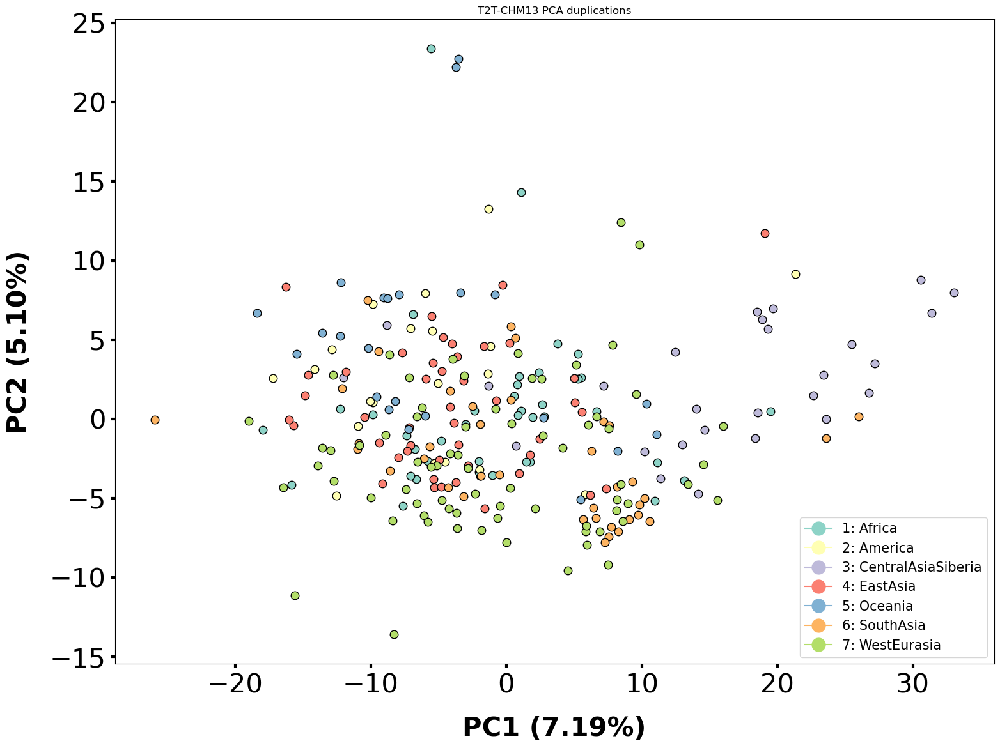

In [156]:
plot_scatter_cluster(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (7.19%)', label_vertical='PC2 (5.10%)', factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("T2T-CHM13 PCA duplications")

plt.savefig('../plots/t2t_chm13_pca_duplications_pc12_cnvr.png', transparent=True)

             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
Oceania        -0.813329     7.857700    -3.652578     1.145077    -2.853929   
America        -9.833650     1.051058     2.131491    -5.834706     7.218953   
WestEurasia    -4.123412    -2.150215    -7.319741    -2.483635    -1.128654   
WestEurasia    -8.398547    -6.417144     1.888725    -0.729113     1.373414   
Africa          3.805292     4.749855    -7.377034     8.580212     2.859058   
...                  ...          ...          ...          ...          ...   
WestEurasia     9.844080    11.009427     8.301353     3.850000    -6.799974   
Africa         -5.534009    23.369544    11.009855    14.651332     1.595806   
Oceania        -3.716133    22.202781    16.236274     7.672534    -3.038466   
Oceania        -3.533997    22.740514    16.716797     7.192356    -3.841493   
Africa          1.106550    14.320630   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:


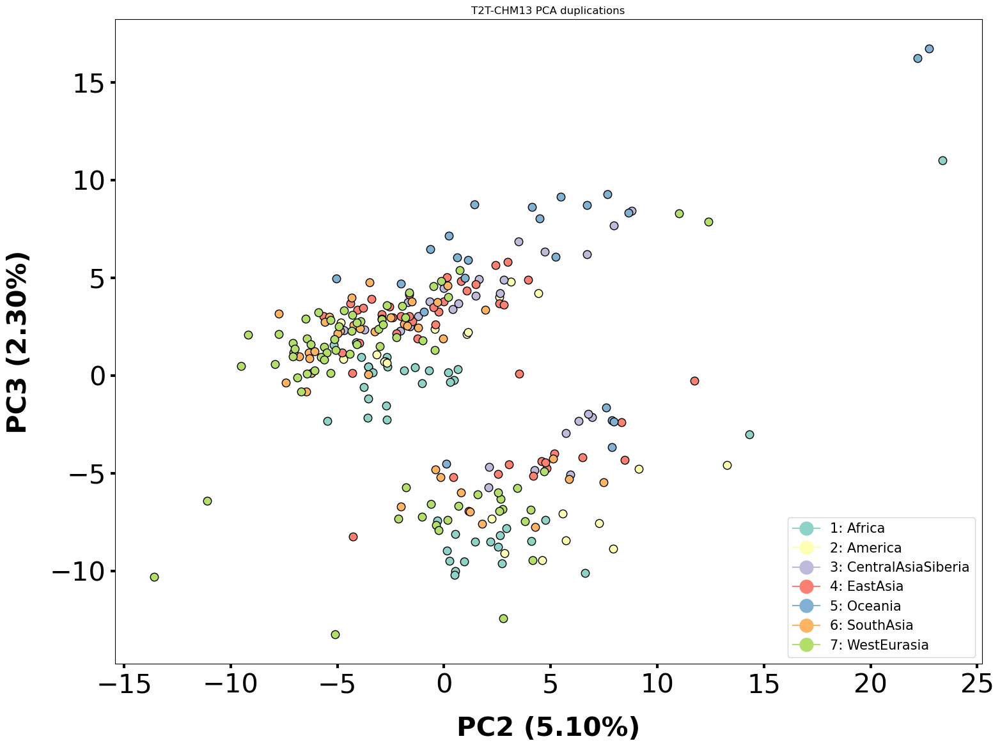

In [157]:
plot_scatter_cluster(data=df_pca, abscissa='component_2', ordinate='component_3', label_horizontal='PC2 (5.10%)', label_vertical='PC3 (2.30%)', factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("T2T-CHM13 PCA duplications")

plt.savefig('../plots/t2t_chm13_pca_duplications_pc23_cnvr.png', transparent=True)

             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
Oceania        -0.813329     7.857700    -3.652578     1.145077    -2.853929   
America        -9.833650     1.051058     2.131491    -5.834706     7.218953   
WestEurasia    -4.123412    -2.150215    -7.319741    -2.483635    -1.128654   
WestEurasia    -8.398547    -6.417144     1.888725    -0.729113     1.373414   
Africa          3.805292     4.749855    -7.377034     8.580212     2.859058   
...                  ...          ...          ...          ...          ...   
WestEurasia     9.844080    11.009427     8.301353     3.850000    -6.799974   
Africa         -5.534009    23.369544    11.009855    14.651332     1.595806   
Oceania        -3.716133    22.202781    16.236274     7.672534    -3.038466   
Oceania        -3.533997    22.740514    16.716797     7.192356    -3.841493   
Africa          1.106550    14.320630   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_

             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
Oceania        -0.813329     7.857700    -3.652578     1.145077    -2.853929   
America        -9.833650     1.051058     2.131491    -5.834706     7.218953   
WestEurasia    -4.123412    -2.150215    -7.319741    -2.483635    -1.128654   
WestEurasia    -8.398547    -6.417144     1.888725    -0.729113     1.373414   
Africa          3.805292     4.749855    -7.377034     8.580212     2.859058   
...                  ...          ...          ...          ...          ...   
WestEurasia     9.844080    11.009427     8.301353     3.850000    -6.799974   
Africa         -5.534009    23.369544    11.009855    14.651332     1.595806   
Oceania        -3.716133    22.202781    16.236274     7.672534    -3.038466   
Oceania        -3.533997    22.740514    16.716797     7.192356    -3.841493   
Africa          1.106550    14.320630   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_

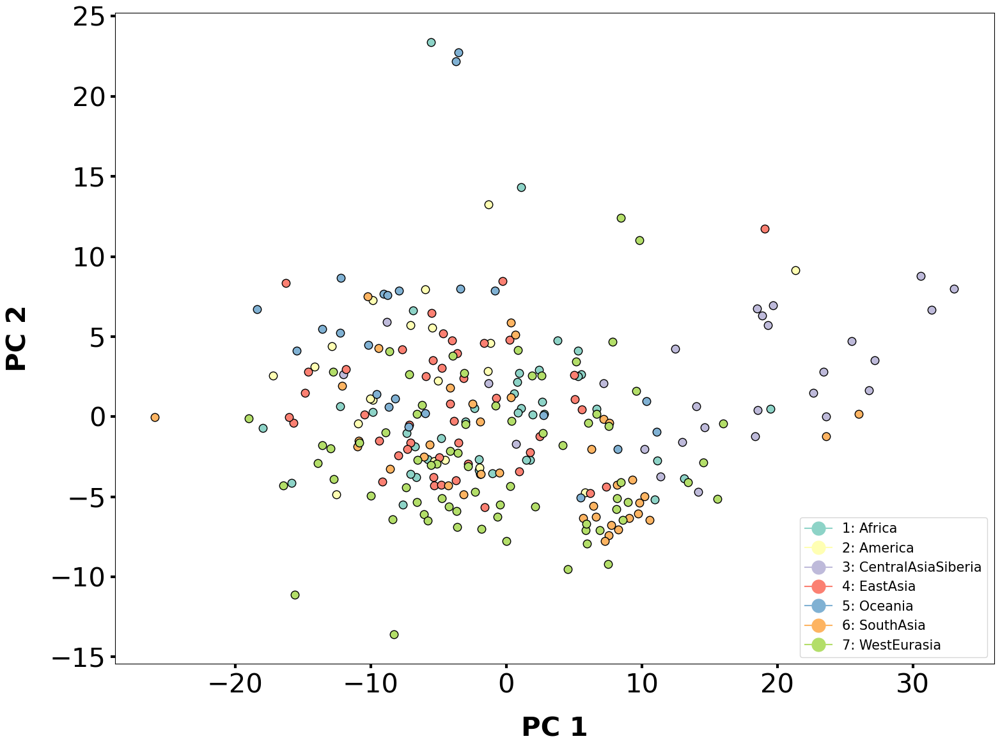

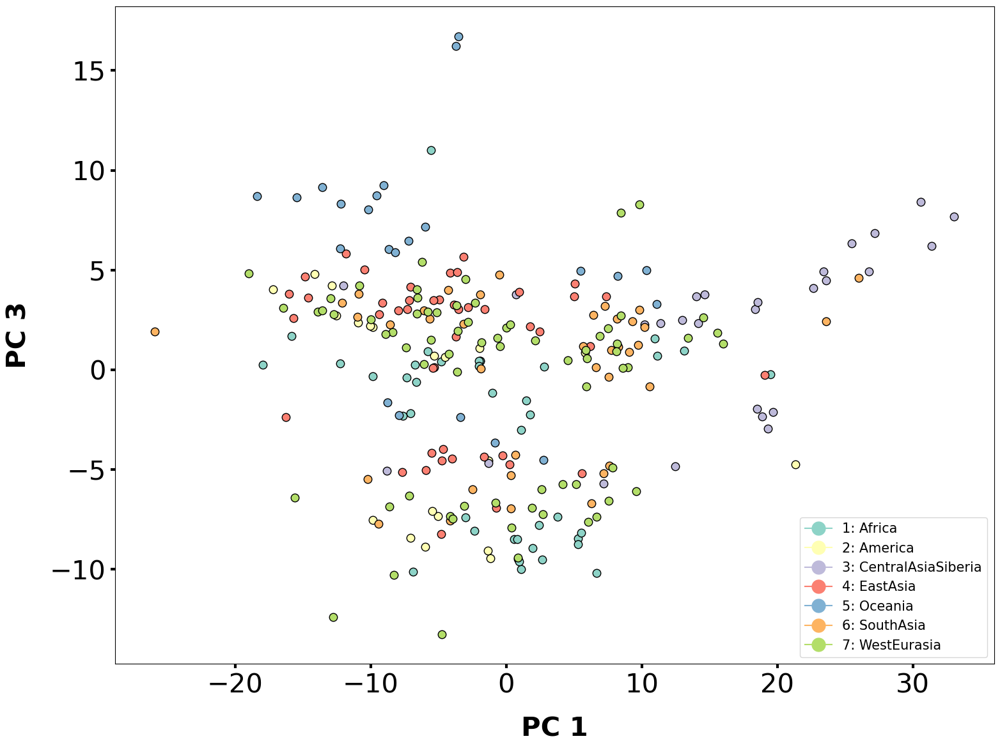

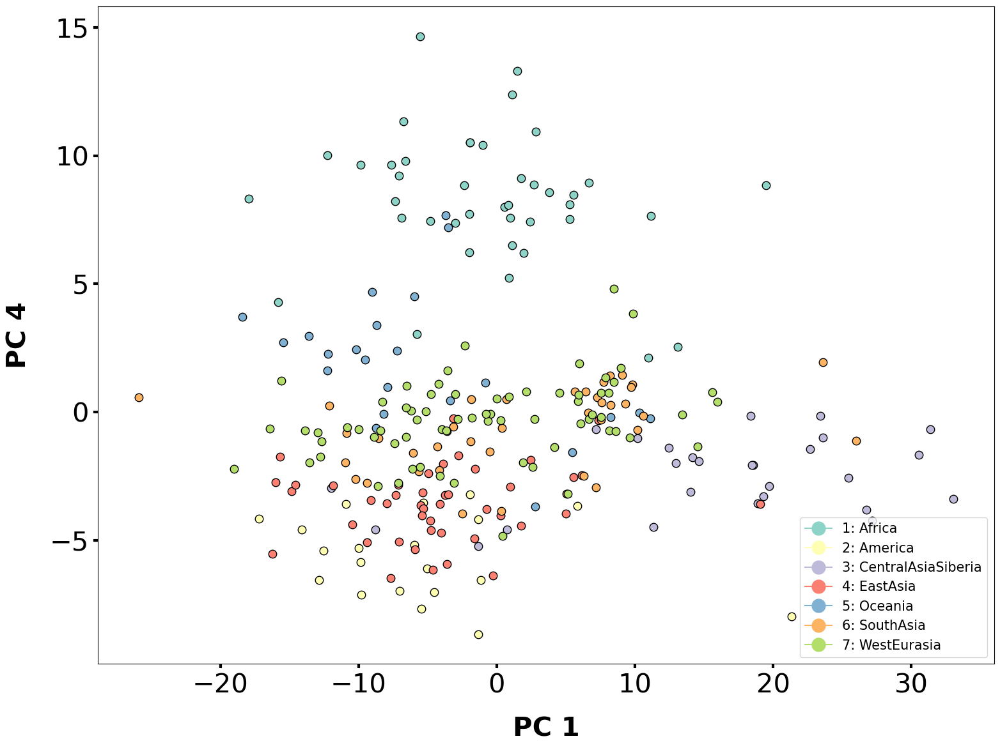

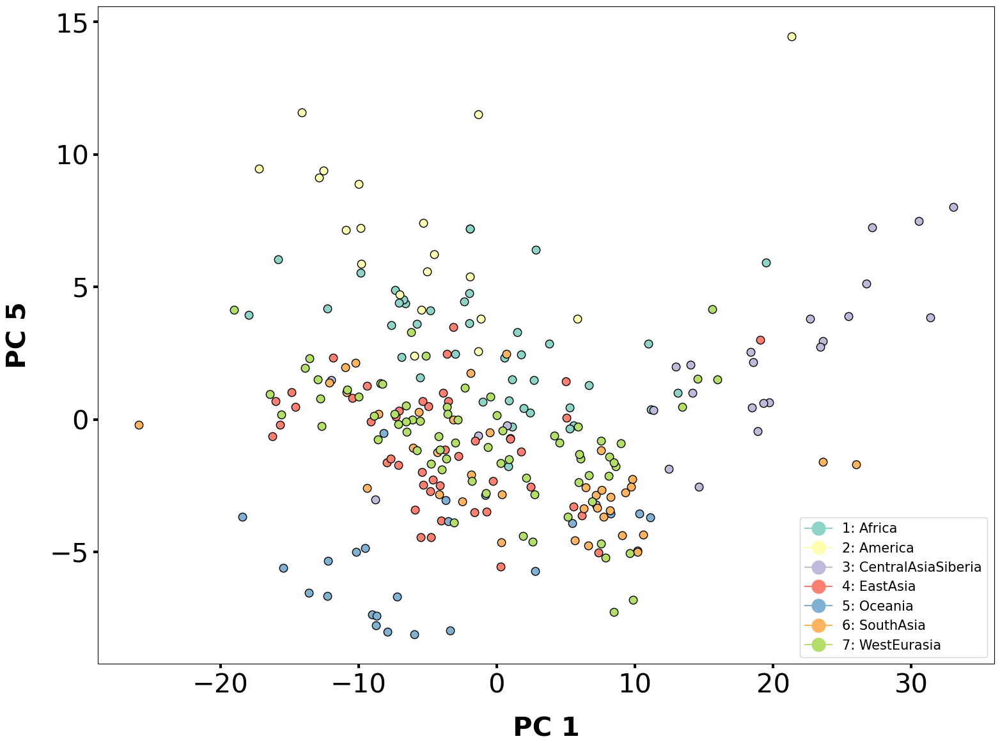

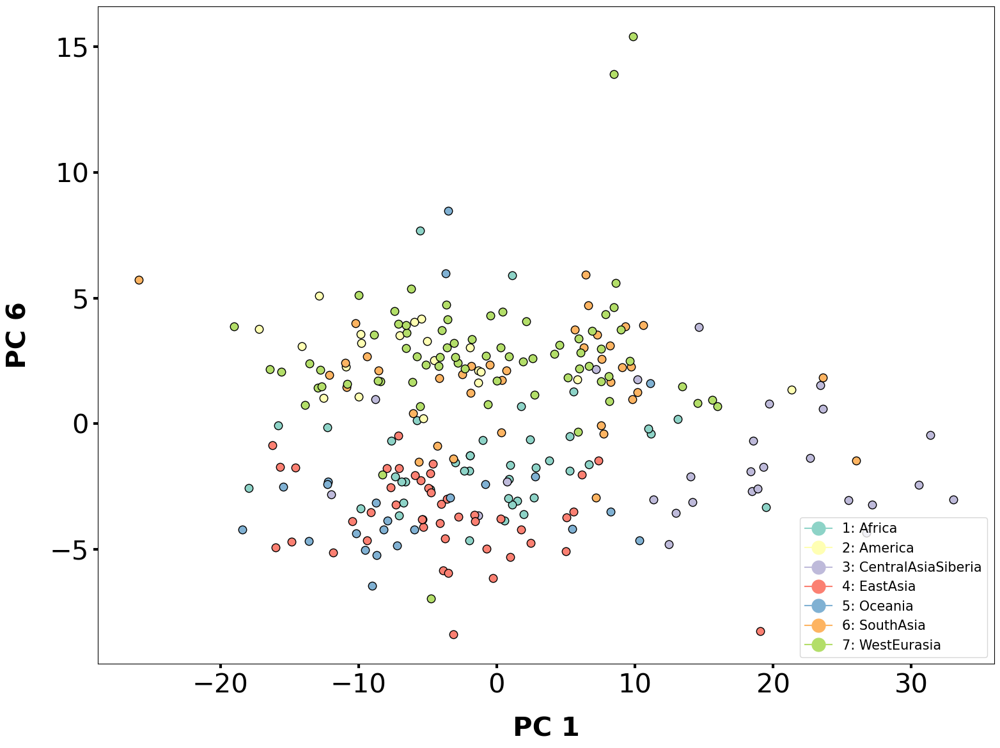

...

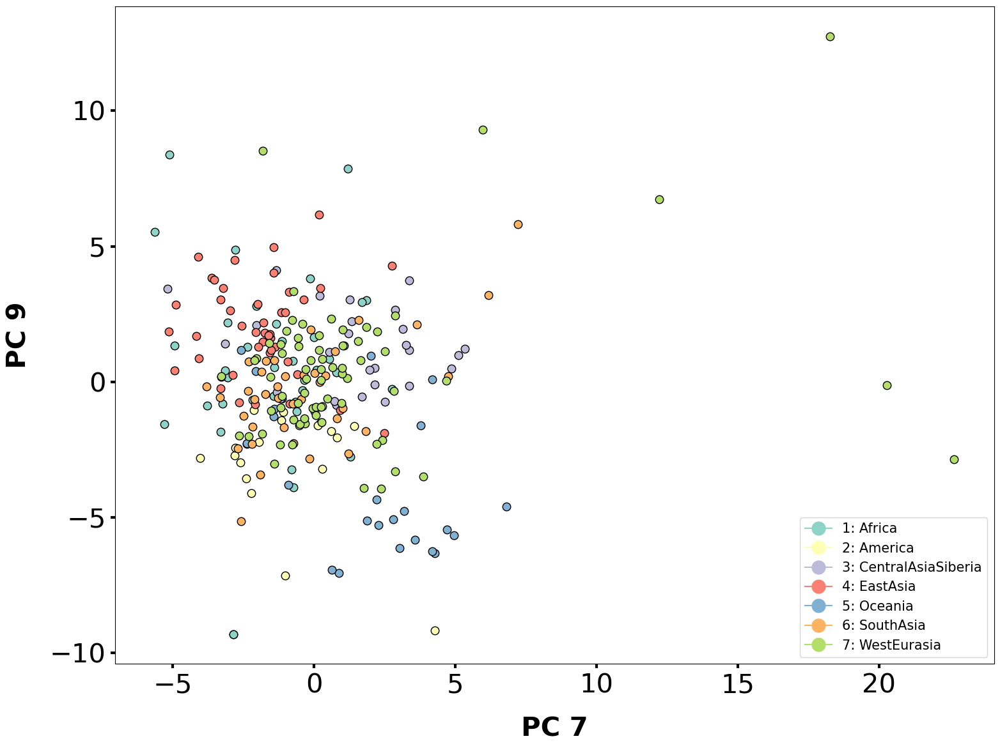

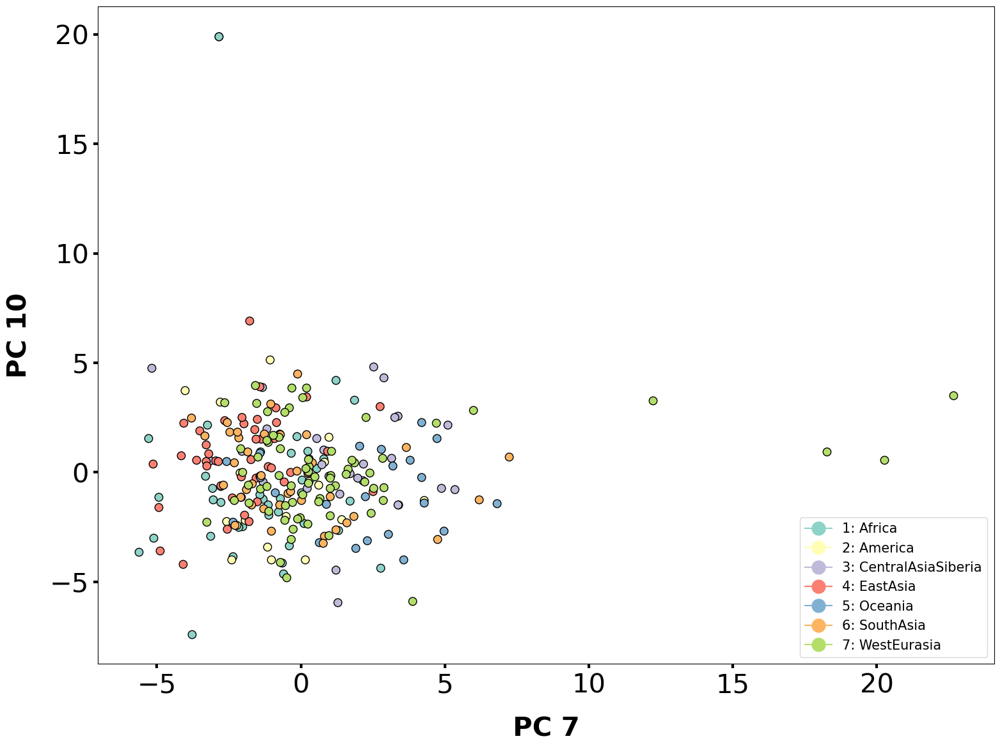

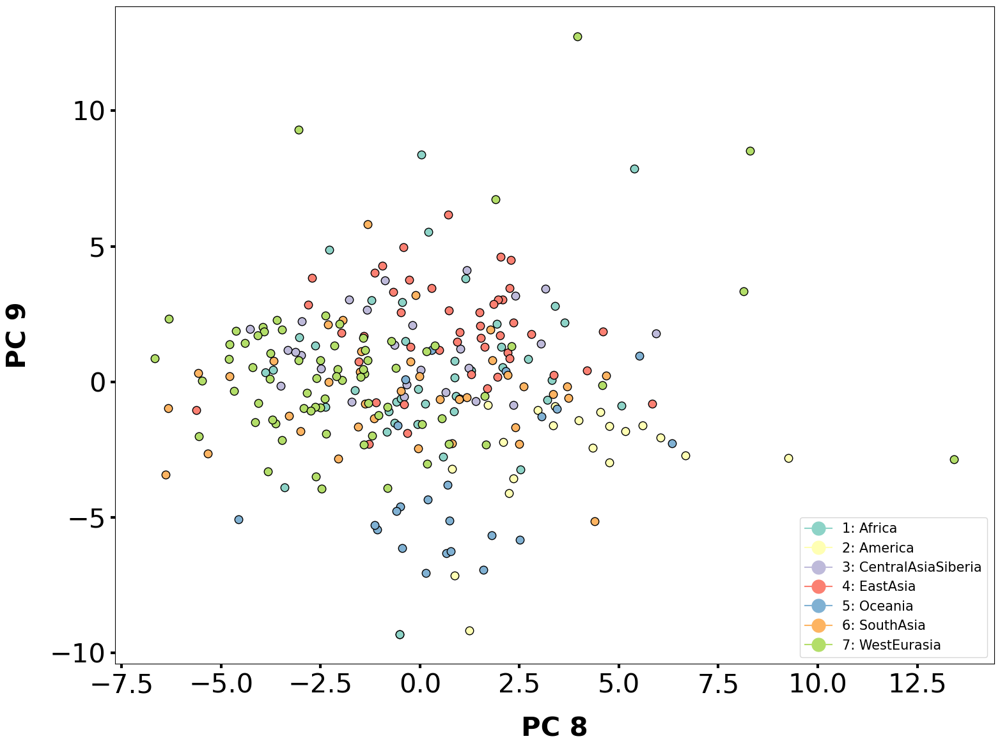

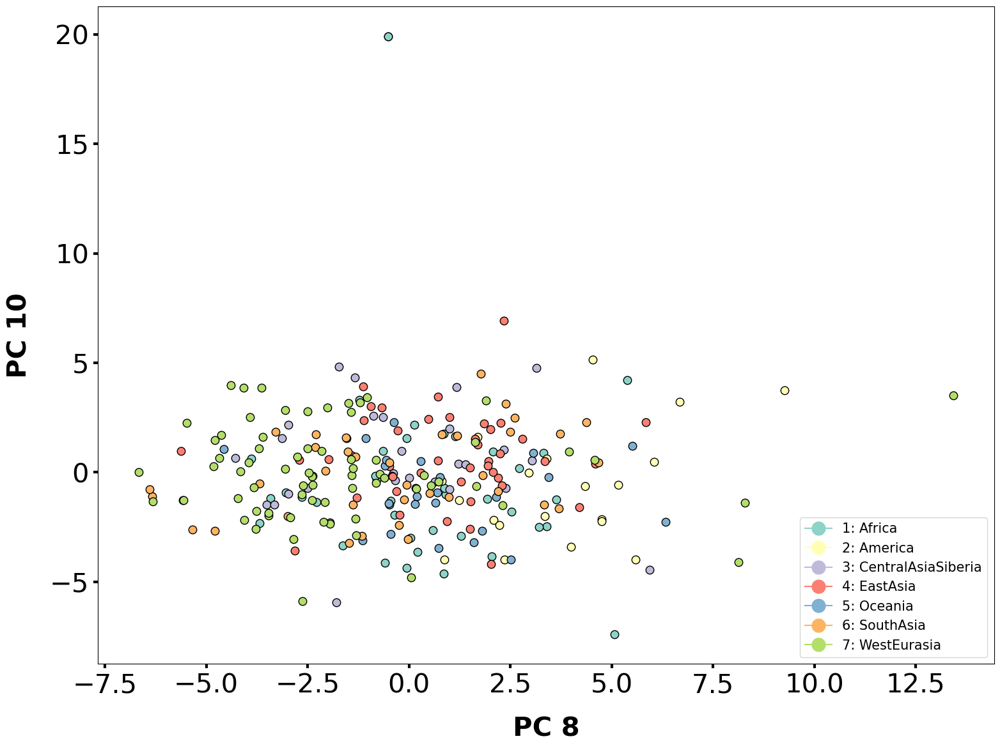

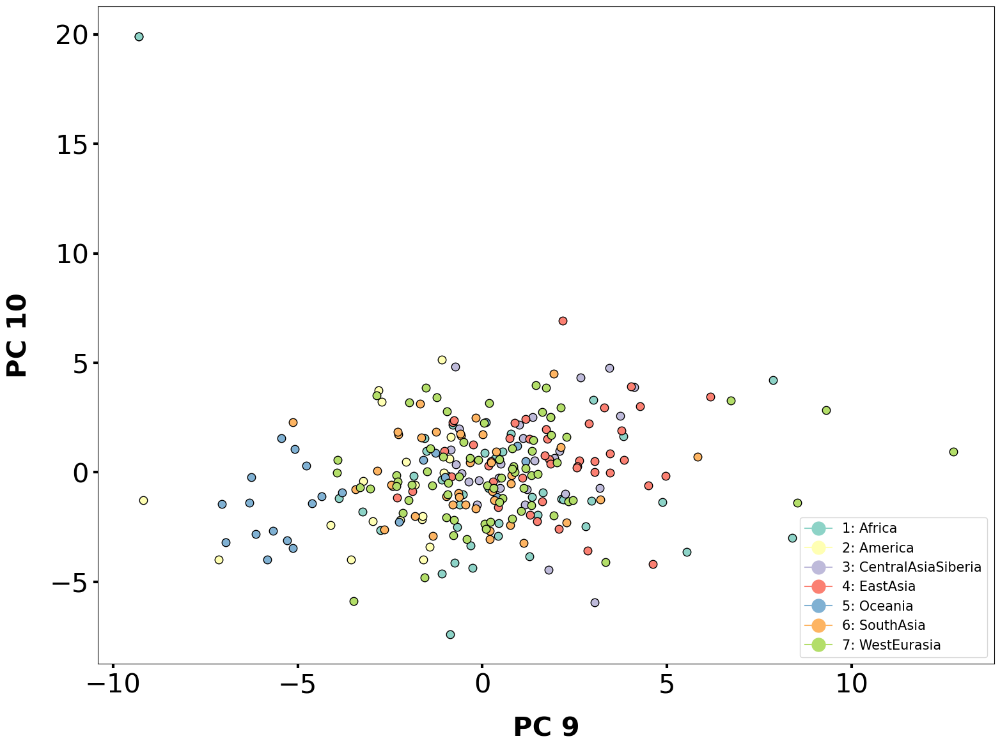

In [158]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))

In [159]:
vst_dt_filtered_duplications = vst_dt.iloc[cnv_passed_vst.index]
vst_dt_filtered_duplications.sort_values(by=['Oceania-WestEurasia'], ascending=False).head(50)

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia,i
108433,chrchr8,144763086,144782295,0.00597,0.08607,0.11986,0.29754,0.00822,0.01630,0.04321,...,0.07582,0.04211,0.15483,0.03913,0.07079,0.20527,0.21660,0.38324,0.04425,108433.0
119741,chrchr10,83240324,83243664,0.13277,0.40516,0.16208,0.00531,0.26846,0.46327,0.10610,...,0.36790,0.04819,0.00000,0.09985,0.02080,0.13354,0.20037,0.37331,0.05329,119741.0
159651,chrchr16,64694368,64715794,0.07163,0.08546,0.00002,0.16450,0.01548,0.06398,0.00000,...,0.39049,0.03040,0.01201,0.16052,0.01642,0.06598,0.24364,0.37248,0.01149,159651.0
164022,chrchr17,10892408,10905466,0.00110,0.05579,0.04690,0.09625,0.00056,0.18659,0.03886,...,0.00812,0.04673,0.32743,0.00642,0.03875,0.25943,0.08559,0.36245,0.20581,164022.0
137611,chrchr13,22203778,22229397,0.02996,0.07856,0.00294,0.14258,0.01981,0.11807,0.01399,...,0.39648,0.02900,0.00537,0.12052,0.04103,0.16052,0.27744,0.34588,0.05528,137611.0
43460,chrchr3,143570876,143587732,0.15977,0.01060,0.19671,0.47335,0.01422,0.01066,0.10066,...,0.41144,0.00013,0.00001,0.14718,0.11689,0.12643,0.39283,0.34468,0.00023,43460.0
13116,chrchr1,233563506,233570810,0.32404,0.52045,0.86890,0.66712,0.24839,0.04955,0.01645,...,0.04948,0.06593,0.22898,0.00964,0.32794,0.53320,0.17582,0.34372,0.07442,13116.0
58207,chrchr4,181936688,181943703,0.08443,0.00173,0.03317,0.18388,0.01324,0.03647,0.08818,...,0.22571,0.00536,0.02030,0.35273,0.00468,0.00006,0.28887,0.34327,0.00555,58207.0
55742,chrchr4,109306446,109349208,0.14723,0.03220,0.06116,0.19548,0.02269,0.01072,0.06137,...,0.09689,0.00056,0.10268,0.03243,0.01237,0.13921,0.09617,0.34304,0.07760,55742.0
7266,chrchr1,88471728,88473184,0.06032,0.06059,0.00049,0.31617,0.01291,0.00156,0.00101,...,0.39340,0.08180,0.02296,0.30477,0.00898,0.00347,0.21930,0.31124,0.01922,7266.0


<h1> Permutation

In [ ]:
print("Starting permutation")
### Grouping again 
cnvs_passed_vst = cnvs.T.iloc[filtering_vst.T.index]
cnvs_passed_vst = cnvs_passed_vst.T

dt_cnvs_passed_vst = features.merge(cnvs_passed_vst, left_index=True, right_index=True)
dt_cnvs_passed_vst.head()


In [ ]:
cnvs_passed_vst.columns

In [ ]:
####### Groupby regions #######
dt_group = dt_cnvs_passed_vst.groupby('Region')

dt_groupped = []
regions = features['Region'].unique()
for i in regions:
    dt_groupped.append(dt_group.get_group(str(i)))
    

#### Names to pair-population
regions = dt['Region'].unique()
combination_names = []
for i in list(combinations(regions,2)):
    combination_names.append(i[0]+str('-')+i[1])
    
dt_groupped[region[0]]

In [145]:
p_value_permutation = []

combination_regions = list(combinations([0,1,2,3,4,5,6],2)) 
for region in combination_regions:
    p_value= []
    p_value_permutation.append(p_value)
    
    for i in cnvs_passed_vst.columns:
        permutation = PermutationTest(dt_groupped[region[0]][i], dt_groupped[region[1]][i], stat=vst_function, n_perm=9999)#mean_gt
        p_value.append(permutation.p_value())

/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_30308/2717296093.py:25: RuntimeWarning: invalid value encountered in scalar divide
  vst = (vt-vs)/vt


KeyboardInterrupt: 

In [ ]:
pd.DataFrame(p_value_permutation)

In [ ]:
permutation_pased__vst_chm13 = pd.DataFrame(p_value_permutation).set_axis(combination_names)
# create a process pool that uses all cpus
permutation_pased__vst_chm13.to_csv('../data/permutation_passed_vst_chm13.csv')
permutation_pased__vst_chm13

In [ ]:
permutation_pased__vst_chm13  = pd.read_csv('../data/permutation_passed_vst_chm13.csv', index_col=0)
permutation_pased__vst_chm13 = permutation_pased__vst_chm13.fillna(0)

<h1> Just vst values that passed permutation

In [74]:
vst_dt_filtered = vst_dt.iloc[filtering_vst.T.index]
vst_dt_filtered = vst_dt_filtered.reset_index()
vst_dt_sb = vst_dt_filtered.drop(columns=['chr', 'start','end', 'index'])
vst_dt_sb.describe()

NameError: name 'vst_dt' is not defined

In [ ]:
passed_permut = (permutation_pased__vst_chm13 <0.05)
## Deleting columns where none of the regions passed the imputation
passed_permut =  passed_permut.loc[:, passed_permut.any()]


passed_permut = passed_permut.T
passed_permut = passed_permut.replace(False, np.NaN)
passed_permut = passed_permut.reset_index()
passed_permut = passed_permut.drop(columns=['index'])
passed_permut#.describe()

In [ ]:
passed_permut[passed_permut.notnull()] = vst_dt_sb

In [ ]:
passed_permut

In [ ]:
#sns.set_palette("bright")
for i in passed_permut.columns:
    plt.hist(passed_permut[i], bins=100, alpha=0.2,log=True, color="blue")
    plt.title('T2T-CHM13')

In [ ]:
final_candidates  = pd.DataFrame(passed_permut.T)>=0.2
final_candidates = final_candidates.loc[:, final_candidates.any()]
final_candidates

<h2> Anotating genes 


In [207]:
vst_dt_filtered_ranges = PyRanges(vst_dt_filtered)
vst_dt_filtered_ranges 

/opt/anaconda3/lib/python3.11/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return {k: v for k, v in df.groupby(grpby_key)}


,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia,i
0,chr1,4119209,4123876,0.00358,0.07555,0.00279,0.01831,0.13432,0.06417,0.13336,...,0.02944,0.02199,0.00108,0.00745,0.10270,0.04197,0.08546,0.01125,0.01342,2859.0
1,chr1,5373793,5375048,0.11646,0.15901,0.04903,0.00529,0.01122,0.00745,0.46901,...,0.26430,0.09410,0.08024,0.02359,0.10044,0.08628,0.03249,0.02018,0.00023,2973.0
2,chr1,7884464,7898408,0.00137,0.19214,0.00663,0.00171,0.07493,0.01380,0.20801,...,0.12990,0.04874,0.08173,0.00089,0.03247,0.00126,0.03888,0.00345,0.01988,3181.0
3,chr1,9027078,9126952,0.11322,0.15759,0.04063,0.02407,0.00195,0.00094,0.36415,...,0.24866,0.14259,0.09496,0.00176,0.01992,0.04695,0.00919,0.02439,0.00466,3260.0
4,chr1,9285874,9351410,0.23644,0.27229,0.04292,0.00510,0.09830,0.01985,0.00460,...,0.18713,0.05719,0.14793,0.01534,0.00937,0.00508,0.04876,0.00374,0.02938,3269.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1040,chr18,66465013,66585794,0.10172,0.14927,0.04288,0.01066,0.08840,0.11119,0.01452,...,0.22360,0.02166,0.02464,0.09175,0.01185,0.01586,0.15292,0.17402,0.00001,172262.0
1041,chr18,67974136,67991293,0.04005,0.07557,0.01498,0.00284,0.00030,0.04565,0.23625,...,0.07493,0.07226,0.00018,0.00418,0.01115,0.01706,0.00141,0.02301,0.03944,172294.0
1042,chr18,68041106,68075150,0.01920,0.04145,0.07662,0.00000,0.04574,0.02373,0.00489,...,0.04368,0.00000,0.00099,0.06939,0.21308,0.15132,0.04452,0.01880,0.00124,172298.0
1043,chr18,71524229,71548201,0.01152,0.10119,0.00651,0.00115,0.00353,0.00841,0.20801,...,0.10336,0.06024,0.04435,0.00186,0.00026,0.00017,0.00062,0.00262,0.00078,172409.0


In [208]:
vst_dt_filtered

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia,i
2859,chr1,4119209,4123876,0.00358,0.07555,0.00279,0.01831,0.13432,0.06417,0.13336,...,0.02944,0.02199,0.00108,0.00745,0.10270,0.04197,0.08546,0.01125,0.01342,2859.0
2973,chr1,5373793,5375048,0.11646,0.15901,0.04903,0.00529,0.01122,0.00745,0.46901,...,0.26430,0.09410,0.08024,0.02359,0.10044,0.08628,0.03249,0.02018,0.00023,2973.0
3181,chr1,7884464,7898408,0.00137,0.19214,0.00663,0.00171,0.07493,0.01380,0.20801,...,0.12990,0.04874,0.08173,0.00089,0.03247,0.00126,0.03888,0.00345,0.01988,3181.0
3260,chr1,9027078,9126952,0.11322,0.15759,0.04063,0.02407,0.00195,0.00094,0.36415,...,0.24866,0.14259,0.09496,0.00176,0.01992,0.04695,0.00919,0.02439,0.00466,3260.0
3269,chr1,9285874,9351410,0.23644,0.27229,0.04292,0.00510,0.09830,0.01985,0.00460,...,0.18713,0.05719,0.14793,0.01534,0.00937,0.00508,0.04876,0.00374,0.02938,3269.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
172262,chr18,66465013,66585794,0.10172,0.14927,0.04288,0.01066,0.08840,0.11119,0.01452,...,0.22360,0.02166,0.02464,0.09175,0.01185,0.01586,0.15292,0.17402,0.00001,172262.0
172294,chr18,67974136,67991293,0.04005,0.07557,0.01498,0.00284,0.00030,0.04565,0.23625,...,0.07493,0.07226,0.00018,0.00418,0.01115,0.01706,0.00141,0.02301,0.03944,172294.0
172298,chr18,68041106,68075150,0.01920,0.04145,0.07662,0.00000,0.04574,0.02373,0.00489,...,0.04368,0.00000,0.00099,0.06939,0.21308,0.15132,0.04452,0.01880,0.00124,172298.0
172409,chr18,71524229,71548201,0.01152,0.10119,0.00651,0.00115,0.00353,0.00841,0.20801,...,0.10336,0.06024,0.04435,0.00186,0.00026,0.00017,0.00062,0.00262,0.00078,172409.0


In [209]:
#Genes
grch37_coordinates_genes = vst_dt_filtered_ranges.nearest(t2t_genes)
grch37_coordinates_genes = grch37_coordinates_genes.as_df()
grch37_coordinates_genes = grch37_coordinates_genes[grch37_coordinates_genes['Distance'] <1 ]
grch37_coordinates_genes

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia,i,Start_b,End_b,name2,Distance
0,chr1,7884464,7898408,0.00137,0.19214,0.00663,0.00171,0.07493,0.01380,0.20801,...,0.03247,0.00126,0.03888,0.00345,0.01988,3181.0,7885238,8350921,RERE,0
1,chr1,9027078,9126952,0.11322,0.15759,0.04063,0.02407,0.00195,0.00094,0.36415,...,0.01992,0.04695,0.00919,0.02439,0.00466,3260.0,9037427,9039811,AL928921.1,0
2,chr1,9285874,9351410,0.23644,0.27229,0.04292,0.00510,0.09830,0.01985,0.00460,...,0.00937,0.00508,0.04876,0.00374,0.02938,3269.0,9271708,9366883,CLSTN1,0
3,chr1,9851641,9863898,0.07710,0.03935,0.05017,0.06475,0.02201,0.05433,0.21271,...,0.00368,0.00060,0.01037,0.00052,0.00631,3287.0,9754141,9925202,MSTRG.42,0
4,chr1,10800228,10824947,0.00743,0.15214,0.00315,0.01255,0.00222,0.00137,0.21723,...,0.01003,0.00853,0.02387,0.01846,0.00009,3378.0,10648100,10804160,MSTRG.46,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1027,chr18,65859039,65961316,0.00396,0.06842,0.00111,0.06541,0.02811,0.00491,0.11102,...,0.03857,0.01070,0.17735,0.09247,0.00795,172242.0,65956459,66087248,CDH7,0
1028,chr18,66046878,66065957,0.01455,0.05210,0.00699,0.06541,0.01565,0.01288,0.01622,...,0.00185,0.00095,0.14423,0.12385,0.00013,172248.0,65956459,66087248,CDH7,0
1029,chr18,67974136,67991293,0.04005,0.07557,0.01498,0.00284,0.00030,0.04565,0.23625,...,0.01115,0.01706,0.00141,0.02301,0.03944,172294.0,67735137,68118061,AC114689.3,0
1030,chr18,68041106,68075150,0.01920,0.04145,0.07662,0.00000,0.04574,0.02373,0.00489,...,0.21308,0.15132,0.04452,0.01880,0.00124,172298.0,67735137,68118061,AC114689.3,0


In [213]:
#America

In [214]:
ls = []
for index,row in grch37_coordinates_genes.iterrows():
    if (row['Africa-America'] > 0.2 and row['Africa-Oceania'] < 0.1 and row['Africa-CentralAsiaSiberia'] < 0.1):
        ls.append(row)
pd.DataFrame(ls)

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia,i,Start_b,End_b,name2,Distance
14,chr1,30510137,30680406,0.21360,0.00078,0.00579,0.03732,0.00587,0.00825,0.22661,...,0.00000,0.00040,0.01098,0.00483,0.00038,4503.0,30561247,30573556,MATN1,0
99,chr1,219422081,219436625,0.22364,0.00000,0.01072,0.00000,0.00000,0.00346,0.19756,...,0.01030,0.01000,0.00000,0.00231,0.00329,12280.0,219387566,219511733,RAB3GAP2,0
100,chr1,219550302,219577170,0.20019,0.03128,0.04951,0.01567,0.00322,0.00482,0.03549,...,0.02796,0.01752,0.00310,0.00033,0.00066,12285.0,219553239,219554860,XRCC6P3,0
162,chr2,51742787,51780800,0.21540,0.00451,0.01500,0.01286,0.00918,0.00591,0.32330,...,0.00016,0.00209,0.00005,0.00126,0.00078,22093.0,51028762,52404220,AC007402.1,0
178,chr2,98696589,98729041,0.20608,0.02740,0.12195,0.01386,0.00658,0.06814,0.10495,...,0.07395,0.00646,0.00156,0.01743,0.03386,23810.0,98545331,98771506,VWA3B,0
179,chr2,99913842,99967740,0.24459,0.01349,0.00164,0.01482,0.00007,0.00331,0.20540,...,0.00108,0.00040,0.01368,0.00263,0.00251,23877.0,99859124,99948629,REV1,0
185,chr2,121727134,121773381,0.22970,0.05089,0.14228,0.04024,0.03878,0.04820,0.07649,...,0.03674,0.02258,0.00003,0.00083,0.00142,24964.0,121745280,121745698,RPS17P7,0
195,chr2,157748996,157779323,0.25053,0.00594,0.02472,0.07257,0.00021,0.00320,0.32330,...,0.02032,0.00712,0.06550,0.02878,0.00194,26433.0,157710859,157771631,GALNT5,0
283,chr3,135013481,135038330,0.31031,0.07630,0.06294,0.00372,0.03750,0.12788,0.10078,...,0.00291,0.01700,0.01426,0.06865,0.03111,43082.0,134277280,135029848,CPNE4,0
401,chr5,22639140,22646470,0.25042,0.01671,0.00654,0.00099,0.03463,0.00247,0.17015,...,0.01142,0.01620,0.04792,0.00027,0.04751,66428.0,21857990,22961025,CDH12,0


In [215]:
## Oceania population

In [216]:
ls = []
for index,row in grch37_coordinates_genes.iterrows():
    if (row['Oceania-WestEurasia'] > 0.2 and row['Africa-WestEurasia'] < 0.1 and row['SouthAsia-WestEurasia'] < 0.1):
        ls.append(row)

pd.DataFrame(ls)

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia,i,Start_b,End_b,name2,Distance
17,chr1,34463743,34520204,0.00909,0.00540,0.00217,0.09864,0.00105,0.06131,0.03258,...,0.00659,0.08788,0.13098,0.20793,0.04858,4698.0,34502790,34548367,AC099565.1,0
42,chr1,88471728,88473184,0.06032,0.06059,0.00049,0.31617,0.01291,0.00156,0.00101,...,0.00898,0.00347,0.21930,0.31124,0.01922,7266.0,88356629,88528360,PKN2-AS1,0
93,chr1,209788004,209790064,0.20608,0.13288,0.15581,0.15948,0.01141,0.00439,0.01901,...,0.10298,0.23056,0.10810,0.22259,0.03466,11760.0,209566924,209918127,HHAT,0
105,chr1,233563506,233570810,0.32404,0.52045,0.86890,0.66712,0.24839,0.04955,0.01645,...,0.32794,0.53320,0.17582,0.34372,0.07442,13116.0,233291128,233714625,SLC35F3,0
147,chr2,3700828,3731707,0.01040,0.00001,0.00001,0.10491,0.00117,0.03634,0.01440,...,0.00163,0.04520,0.13740,0.25792,0.02487,19577.0,3681120,3725243,ALLC,0
193,chr2,153052632,153059399,0.04396,0.00983,0.13820,0.41275,0.01613,0.01593,0.00964,...,0.06192,0.07827,0.25654,0.27627,0.00004,26258.0,152787194,153102395,MSTRG.3240,0
326,chr4,28367332,28376265,0.01286,0.00027,0.00029,0.12556,0.00507,0.02222,0.01172,...,0.00295,0.01753,0.17735,0.23895,0.00588,53389.0,28329496,28388606,AC093791.1,0
354,chr4,109306446,109349208,0.14723,0.03220,0.06116,0.19548,0.02269,0.01072,0.06137,...,0.01237,0.13921,0.09617,0.34304,0.07760,55742.0,109270215,109315140,NPNT,0
414,chr5,65976682,65995268,0.04418,0.13457,0.26544,0.55675,0.16370,0.05244,0.01782,...,0.01903,0.09908,0.19896,0.29472,0.03204,67702.0,65968850,66020530,MSTRG.4499,0
501,chr6,99137775,99203370,0.02523,0.03687,0.00964,0.29728,0.00318,0.00213,0.07843,...,0.00185,0.01598,0.24719,0.24647,0.00783,82780.0,98479480,99573180,AL589740.1,0


In [217]:
## WEST EURASIA

In [221]:
ls = []
for index,row in grch37_coordinates_genes.iterrows():
    if (row['Oceania-WestEurasia'] > 0.2 and row['Africa-Oceania']  < 0.1 and row['Africa-CentralAsiaSiberia'] < 0.1 and row['Oceania-SouthAsia'] < 0.1):
        ls.append(row)

pd.DataFrame(ls)

""


In [222]:
##Siberia

In [223]:
ls = []
for index,row in grch37_coordinates_genes.iterrows():
    if (row['Africa-CentralAsiaSiberia'] > 0.2 and row['Africa-Oceania']  < 0.1 and row['Africa-America'] < 0.1 and row['EastAsia-Oceania'] < 0.1):
        ls.append(row)

pd.DataFrame(ls)

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia,i,Start_b,End_b,name2,Distance
19,chr1,36097508,36132105,0.04365,0.23970,0.00968,0.00035,0.08453,0.01471,0.08745,...,0.03791,0.00104,0.06767,0.00834,0.02220,4785.0,36087319,36166996,THRAP3,0
23,chr1,40134647,40168960,0.06200,0.22104,0.01996,0.00528,0.09141,0.02973,0.08408,...,0.02557,0.00024,0.06342,0.00949,0.02633,5060.0,40127491,40163705,MSTRG.157,0
48,chr1,108598620,108653379,0.00003,0.25083,0.00230,0.00077,0.02640,0.05300,0.22219,...,0.01574,0.03872,0.03344,0.05387,0.00394,8033.0,108593076,108677894,FAM102B,0
52,chr1,150152803,150260422,0.00294,0.23891,0.00304,0.00113,0.00928,0.00002,0.16823,...,0.00191,0.00224,0.01213,0.00086,0.00776,8775.0,150132138,150159408,PRUNE1,0
55,chr1,153345649,153364424,0.00939,0.21405,0.10764,0.07258,0.02312,0.03033,0.19544,...,0.03167,0.02687,0.01365,0.00846,0.00033,8921.0,153343905,153357775,C1orf43,0
64,chr1,165094905,165105113,0.00001,0.26071,0.01296,0.01810,0.00383,0.00019,0.21761,...,0.00295,0.00802,0.03131,0.00946,0.00148,9558.0,165070668,165115003,TMCO1,0
87,chr1,203758238,203812014,0.02789,0.24705,0.00334,0.00545,0.03087,0.00456,0.09230,...,0.01147,0.00007,0.01056,0.00000,0.01040,11346.0,203733990,203759125,PIK3C2B,0
106,chr1,234066659,234074454,0.00944,0.22923,0.01296,0.00573,0.08906,0.05364,0.13867,...,0.03876,0.02090,0.04615,0.02286,0.00179,13146.0,234046480,234073915,AL160408.1,0
182,chr2,112124970,112128173,0.03417,0.23164,0.01072,0.02830,0.04259,0.01589,0.11716,...,0.01741,0.00286,0.00482,0.00001,0.00588,24505.0,111855104,112125174,AC017002.3,0
222,chr2,231500383,231519049,0.00105,0.22076,0.00141,0.01156,0.02001,0.00217,0.15574,...,0.01086,0.00017,0.00096,0.00233,0.00695,29920.0,231479395,231509562,SPATA3,0


In [224]:
# EastAsia

In [226]:
ls = []
for index,row in grch37_coordinates_genes.iterrows():
    if (row['Africa-EastAsia'] > 0.2 and row['Africa-Oceania']  < 0.1 and row['Africa-America'] < 0.1) and row['Africa-CentralAsiaSiberia'] < 0.1:
        ls.append(row)

pd.DataFrame(ls)

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia,i,Start_b,End_b,name2,Distance
491,chr6,66802171,66847328,0.04072,0.05932,0.24013,0.09465,0.02364,0.00658,0.0039,...,0.11814,0.19792,0.01493,0.04264,0.00624,81845.0,64866188,66858763,EYS,0


In [227]:
# South Asia

In [228]:
ls = []
for index,row in grch37_coordinates_genes.iterrows():
    if (row['Africa-SouthAsia'] > 0.2 and row['Africa-Oceania']  < 0.1 and row['Africa-America'] < 0.1):
        ls.append(row)

pd.DataFrame(ls)

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia,i,Start_b,End_b,name2,Distance
708,chr10,118400567,118430876,0.02433,0.00291,0.07883,0.07379,0.21585,0.05337,0.04775,...,0.04689,0.00212,0.02844,0.00407,0.05506,121461.0,118367645,118436709,EMX2OS,0


In [229]:
# Africa
ls = []
for index,row in grch37_coordinates_genes.iterrows():
    if (row['Africa-SouthAsia'] > 0.2 and row['Oceania-WestEurasia']  < 0.1 and row['America-WestEurasia'] < 0.1 and row['EastAsia-Oceania'] < 0.1):
        ls.append(row)

pd.DataFrame(ls)

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia,i,Start_b,End_b,name2,Distance
84,chr1,198398895,198448244,0.46575,0.40866,0.54050,0.46887,0.33835,0.18956,0.04334,...,0.15585,0.13089,0.06603,0.04244,0.00630,10947.0,198407316,198652058,LINC02789,0
223,chr2,237033136,237069036,0.25518,0.31468,0.24037,0.32410,0.22913,0.15729,0.00800,...,0.00008,0.00030,0.00899,0.00937,0.00058,30300.0,237058316,237071623,ACKR3,0
263,chr3,77253354,77261581,0.11633,0.11112,0.26033,0.30647,0.27541,0.12695,0.00044,...,0.00040,0.02222,0.00496,0.03890,0.02640,41201.0,75959933,77702354,ROBO2,0
360,chr4,132658790,132673501,0.18847,0.23330,0.27041,0.20291,0.25413,0.24232,0.01610,...,0.00000,0.00109,0.00000,0.00069,0.00098,56488.0,132666920,132681527,AC082650.2,0
559,chr7,101086784,101120810,0.10042,0.20145,0.29953,0.31531,0.31173,0.25332,0.02583,...,0.00137,0.00800,0.00723,0.03242,0.01483,94973.0,101067526,101105604,CYP3A43,0
606,chr8,36778220,36835810,0.17601,0.19866,0.26716,0.19859,0.27644,0.19471,0.00136,...,0.00086,0.00925,0.00452,0.00283,0.01375,104327.0,36654126,37055218,AC090809.1,0
614,chr8,74489903,74538176,0.18681,0.05170,0.17480,0.05154,0.22135,0.18282,0.05543,...,0.00345,0.00139,0.06212,0.03979,0.00031,105717.0,74481591,74529115,AC087672.2,0
707,chr10,113238188,113251962,0.04136,0.11335,0.33746,0.19744,0.26393,0.07341,0.02438,...,0.00433,0.11562,0.01002,0.02846,0.07179,121187.0,113199177,113247577,GUCY2GP,0
708,chr10,118400567,118430876,0.02433,0.00291,0.07883,0.07379,0.21585,0.05337,0.04775,...,0.04689,0.00212,0.02844,0.00407,0.05506,121461.0,118367645,118436709,EMX2OS,0
747,chr11,47177699,47207572,0.23903,0.50280,0.17060,0.39148,0.21850,0.18871,0.08197,...,0.00626,0.00256,0.01368,0.01901,0.00088,129809.0,47093557,47266077,C11orf49,0


In [230]:
# Deletions in gene regions 

In [259]:
#coordinates = input_vst.iloc[:,0:2]
#Genes
final_cnv_ranges = PyRanges(final_cnv)
final_cnv_genes= final_cnv_ranges.overlap(t2t_genes)
final_cnv_genes = final_cnv_genes.as_df()
cnvs = final_cnv.iloc[:,4:287]
cnvs = cnvs.T
cnvs = cnvs.fillna(2)
cnv_passed_vst = cnvs.T.iloc[filtering_vst.T.index]
cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]<3).all(axis=1)]
counts = cnv_passed_vst.T
counts = counts.sort_index()
counts

/opt/anaconda3/lib/python3.11/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return {k: v for k, v in df.groupby(grpby_key)}


,4068,4165,4698,4724,5401,5537,5664,6921,7519,9324,...,166318,166893,166924,169759,170522,170708,171118,172241,172248,172260
Sample,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A03,2.0,1.0,2.0,1.0,2.0,2.0,2.0,1.0,2.0,2.0,...,1.0,1.000000,2.0,2.0,1.0,2.0,2.0,2.0,2.0,1.0
LP6005441-DNA_A04,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,1.0,2.0,...,2.0,1.000000,2.0,2.0,2.0,1.0,2.0,2.0,1.0,1.0
LP6005441-DNA_A05,2.0,1.0,1.0,2.0,2.0,1.0,2.0,2.0,1.0,2.0,...,2.0,0.333333,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0
LP6005441-DNA_A06,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,...,2.0,2.000000,2.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0
LP6005441-DNA_A08,1.0,1.0,1.0,1.0,2.0,2.0,1.0,2.0,1.0,1.0,...,2.0,2.000000,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,2.0,1.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,1.0,...,2.0,1.000000,2.0,1.0,2.0,2.0,0.5,2.0,2.0,1.0
SS6004471,2.0,1.0,1.0,1.0,2.0,2.0,1.0,2.0,2.0,1.0,...,1.0,1.000000,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
SS6004477,2.0,1.0,2.0,1.0,2.0,2.0,1.0,1.0,1.0,1.0,...,2.0,1.000000,2.0,1.0,2.0,1.0,1.0,2.0,2.0,1.0


In [281]:
cnvs_filtered = final_cnv.iloc[filtering_vst.T.index]

#coordinates = input_vst.iloc[:,0:2]
#Genes
final_cnv_ranges = PyRanges(cnvs_filtered)
final_cnv_genes= final_cnv_ranges.overlap(t2t_genes)
final_cnv_genes = final_cnv_genes.as_df()
cnvs = final_cnv_genes.iloc[:,4:287]
#cnvs = cnvs.T
cnvs = cnvs.fillna(2)

cnv_passed_vst = cnvs[(cnvs[cnvs.columns[1:]]<3).all(axis=1)]
counts = cnv_passed_vst.T
counts = counts.sort_index()
counts

/opt/anaconda3/lib/python3.11/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return {k: v for k, v in df.groupby(grpby_key)}


,8,17,18,25,27,31,45,61,79,93,...,778,783,785,793,794,805,810,812,824,826
Sample,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A03,1.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,1.0,2.0,2.0,1.000000,2.0,2.0,1.0,2.0,2.0,2.0
LP6005441-DNA_A04,2.0,2.0,2.0,2.0,1.0,2.0,1.0,2.0,2.0,0.0,...,1.0,1.0,1.0,1.000000,2.0,2.0,2.0,1.0,2.0,1.0
LP6005441-DNA_A05,1.0,1.0,2.0,2.0,1.0,2.0,1.0,2.0,2.0,2.0,...,2.0,1.0,2.0,0.333333,2.0,2.0,2.0,2.0,1.0,2.0
LP6005441-DNA_A06,2.0,1.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,2.0,...,2.0,2.0,2.0,2.000000,2.0,2.0,2.0,1.0,2.0,2.0
LP6005441-DNA_A08,1.0,1.0,1.0,2.0,2.0,1.0,1.0,1.0,1.0,2.0,...,1.0,1.0,2.0,2.000000,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,1.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,2.0,1.0,...,1.0,1.0,2.0,1.000000,2.0,1.0,2.0,2.0,2.0,2.0
SS6004471,1.0,1.0,1.0,2.0,2.0,1.0,2.0,1.0,2.0,2.0,...,1.0,2.0,1.0,1.000000,2.0,1.0,1.0,1.0,1.0,1.0
SS6004477,1.0,2.0,1.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,...,1.0,2.0,1.0,1.000000,2.0,1.0,2.0,1.0,2.0,2.0


             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
Oceania        -0.242280     1.310112     0.041931    -0.524585     1.805202   
America        -3.400579    -2.159968     1.916016     4.670399    -1.844286   
WestEurasia    -1.968227     0.088391    -0.489532     2.269473    -3.681794   
WestEurasia    -3.270615     0.489335    -1.141815     1.056870    -1.996474   
Africa          1.330550     2.336956    -0.145839     0.786810     2.310845   
...                  ...          ...          ...          ...          ...   
WestEurasia     5.551943    -0.105261     2.835919    -3.101894    -2.965830   
Africa          2.479220     5.396699     6.739066    -2.618005    -2.512781   
Oceania         2.913219    -0.079620     9.509997    -3.354902    -0.411229   
Oceania         2.668343     1.278528    10.467041    -3.293701     0.174699   
Africa         -0.001772     4.819806   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:


Text(0.5, 1.0, 'T2T-CHM13 PCA deletions')

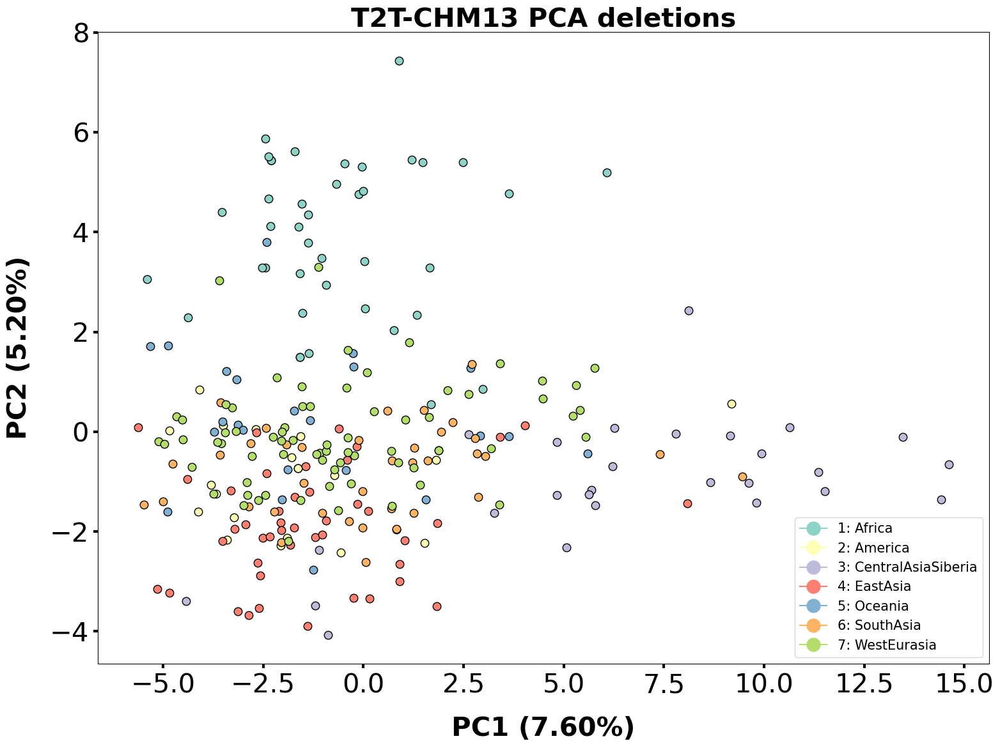

In [282]:
#PCA

x = StandardScaler().fit_transform(counts)
pca = PCA(n_components=10)
pca_results = pca.fit_transform(x)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)

plot_scatter_cluster(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (7.60%)', label_vertical='PC2 (5.20%)', factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("T2T-CHM13 PCA deletions", size=30, fontweight="bold")

In [287]:
cnvs_filtered = final_cnv.iloc[filtering_vst.T.index]

#coordinates = input_vst.iloc[:,0:2]
#Genes
final_cnv_ranges = PyRanges(cnvs_filtered)
final_cnv_genes= final_cnv_ranges.overlap(t2t_genes)
final_cnv_genes = final_cnv_genes.as_df()
cnvs = final_cnv_genes.iloc[:,4:287]
#cnvs = cnvs.T
cnvs = cnvs.fillna(2)

cnv_passed_vst = cnvs[(cnvs[cnvs.columns[1:]]<3).all(axis=1)]



cnv_passed_vst = cnvs[(cnvs[cnvs.columns[1:]]>1).any(axis=1)]
#cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]<5).all(axis=1)]

counts = cnv_passed_vst.T
counts = counts.sort_index()
counts

/opt/anaconda3/lib/python3.11/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return {k: v for k, v in df.groupby(grpby_key)}


,0,1,2,3,4,5,6,7,8,9,...,820,821,822,823,824,825,826,827,828,829
Sample,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A03,2.0,2.000000,1.0,2.0,1.000000,1.0,2.333333,2.0,1.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.000000
LP6005441-DNA_A04,2.0,9.500000,3.0,2.0,3.000000,2.0,3.000000,2.0,2.0,2.0,...,2.0,2.0,2.0,22.0,2.0,1.0,1.0,2.0,2.0,2.000000
LP6005441-DNA_A05,1.0,8.000000,3.0,2.0,3.000000,1.0,4.000000,2.0,1.0,2.0,...,2.0,2.0,2.0,2.0,1.0,1.0,2.0,2.0,2.0,2.000000
LP6005441-DNA_A06,1.0,10.500000,3.0,2.0,2.000000,2.0,3.500000,2.0,2.0,2.0,...,2.0,2.0,2.0,26.0,2.0,2.0,2.0,2.0,1.0,2.000000
LP6005441-DNA_A08,2.0,6.333333,2.0,2.0,2.000000,1.0,2.333333,2.0,1.0,1.0,...,1.0,2.0,1.0,22.0,2.0,2.0,2.0,2.0,2.0,2.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,2.0,1.900000,3.0,2.0,1.666667,2.0,2.666667,1.0,1.0,1.0,...,1.0,1.0,1.0,9.0,2.0,1.0,2.0,1.0,2.0,1.250000
SS6004471,2.0,2.500000,3.0,1.0,1.000000,1.0,2.666667,1.0,1.0,1.0,...,1.0,1.0,2.0,22.0,1.0,1.0,1.0,2.0,1.0,0.750000
SS6004477,3.0,3.285714,3.0,2.0,1.000000,3.0,2.666667,1.0,1.0,1.0,...,1.0,1.0,1.0,12.5,2.0,1.0,2.0,1.0,2.0,1.500000


             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
Oceania         6.478208     8.943265     3.909284     1.708668     1.459640   
America       -11.952717    -0.214094     1.988843    -2.846341    -4.077896   
WestEurasia    -1.821553     8.675032    -0.648139    -5.898850    -0.715817   
WestEurasia   -12.941011    -4.663089    -5.101112    -1.405298    -0.466639   
Africa          5.985291     5.045045     4.728846    -4.431777     9.467323   
...                  ...          ...          ...          ...          ...   
WestEurasia    10.531474    -5.066410     9.785977    10.831472     0.537582   
Africa         -5.666102    -4.040350    21.198817    12.666984    10.400409   
Oceania        -5.173800    -7.551230    19.141786    14.482272     2.667050   
Oceania        -9.279622   -11.278932    21.892801    13.157468     3.101152   
Africa          6.504358     6.312189   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:


Text(0.5, 1.0, 'T2T-CHM13 PCA deletions')

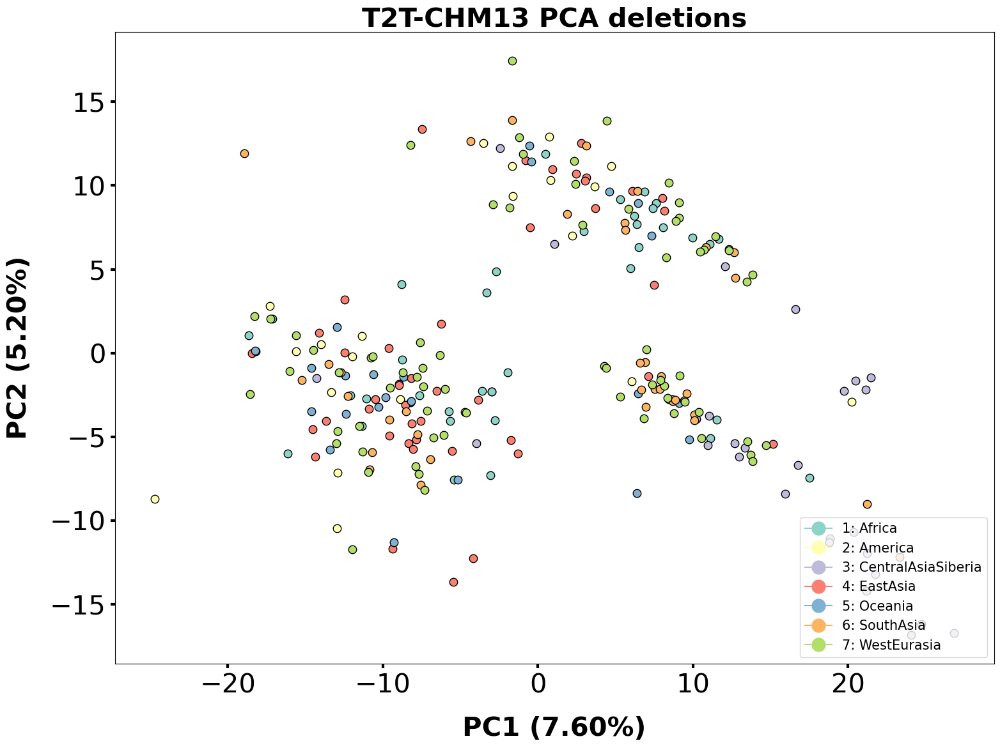

In [288]:
#PCA

x = StandardScaler().fit_transform(counts)
pca = PCA(n_components=10)
pca_results = pca.fit_transform(x)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)

plot_scatter_cluster(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (7.60%)', label_vertical='PC2 (5.20%)', factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("T2T-CHM13 PCA deletions", size=30, fontweight="bold")